In [3]:
import matplotlib.pyplot as plt
import numpy as np
import os

from datetime import datetime
from dateutil import rrule

In [4]:
plt.rcParams.update({'font.size': 25})

In [5]:
import matplotlib.ticker as mticker
import cartopy.crs as ccrs 

### Calculate PDO

In [6]:
def set_minimum_water_to_zero(water):
    water[water < 273.15] = 273.15

In [7]:
def set_non_water_to_zero(earth, mask, mode='ERA5'):
    water_amounts = []
    for k in range(120):
        water_amounts.append(0)
        for h in range(180):
            if mask[k][h] != 0.0:
                if mode == 'ERA5':
                    earth[:, :, k, h] = 0.0
                elif mode == 'Models':
                    earth[:, :, :, k, h] = 0.0
                else:
                    print('Unknown mode')
                    return -1
            else:
                water_amounts[k] += 1
    return water_amounts

In [8]:
def substract_grid_mean(earth, mask, water_amounts, mode='ERA5'):
    def monthly_mean(grid):
        weight = 0.0
        mean_temp = 0.0
        for i in range(120):
            curr_phi = (-89.25 + i * 1.5) * np.pi / 180.0
            curr_cos = np.cos(curr_phi)
            mean_temp += curr_cos * grid[i, mask[i] == 0.0].sum()
            weight += curr_cos * water_amounts[i]
        return mean_temp / weight
    
    if mode == 'ERA5':
        for i in range(42):
            for j in range(12):
                earth[i][j] -= monthly_mean(earth[i][j])
    elif mode == 'Models':
        for i in range(42):
            for j in range(12):
                for y in range(5):
                    earth[i][y][j] -= monthly_mean(earth[i][y][j])
    else:
        print('Unknown mode')
        return -1


In [9]:
def substract_monthly_mean(earth, mode='ERA5'):
    if mode == 'ERA5':
        earth -= np.mean(earth, axis=0)
    elif mode == 'Models':
        for i in range(5):
            curr_years = earth[:, i, :, :, :]
            curr_mean = curr_years.mean(axis=0)
            for j in range(42):
                earth[j][i] -= curr_mean
    else:
        print("Unknown mode")
        return -1

In [10]:
def call_supersvd(ocean):
    ocean.flatten().tofile('res.std')
    os.system('python3 SVD/main.py -x res.std -y res.std -t 504 --dont-subtract-mean --type double -xv xvect.std')  
    arr = np.fromfile('xvect.std', dtype=np.float64).reshape(3, 32, 65)
    return arr[0].flatten()

In [11]:
mask = np.fromfile('data/mask.std', dtype=np.float32).reshape(120, 180).astype('float64')
data = np.fromfile('data/ERA5/TS.STD', dtype=np.float32).reshape(42, 12, 120, 180).astype('float64')
indsX = np.append(np.arange(150, 180), np.arange(0, 35))
indsY = np.arange(72, 100)

In [12]:
def prepare_data(data, mode='ERA5'):
    set_minimum_water_to_zero(data)
    water_amounts = set_non_water_to_zero(data, mask, mode)
    substract_grid_mean(data, mask, water_amounts, mode)
    substract_monthly_mean(data, mode)
    if mode == 'ERA5':
        ocean = data[:, :, 72 : 104, indsX]
    elif mode == 'Models':
        ocean = data[:, :, :, 72 : 104, indsX]
    else:
        print('Unknown mode')
        return -1
    return ocean

In [13]:
def calc_eofs(data, mode='ERA5'):
    ocean = prepare_data(data, mode)
    #eofs = call_supersvd(ocean)
    
    dat_dm1 = ocean.reshape(504, 32, 65)
    dat_dm = []
    for i in range(504):
        dat_dm.append(dat_dm1[i].flatten())
    dat_dm = np.array(dat_dm).T
    u, d, vt = np.linalg.svd(dat_dm, full_matrices=False)
    tvecs_svd = u.T#np.dot(u, np.diag(d)).T
    eofs = tvecs_svd[0] / np.linalg.norm(tvecs_svd[0]) / (np.max(tvecs_svd[0] / 0.015))
    
    return -eofs, ocean

In [14]:
eofs, ocean = calc_eofs(data, mode='ERA5')

In [15]:
ocean.shape

(42, 12, 32, 65)

In [16]:
eofs.shape

(2080,)

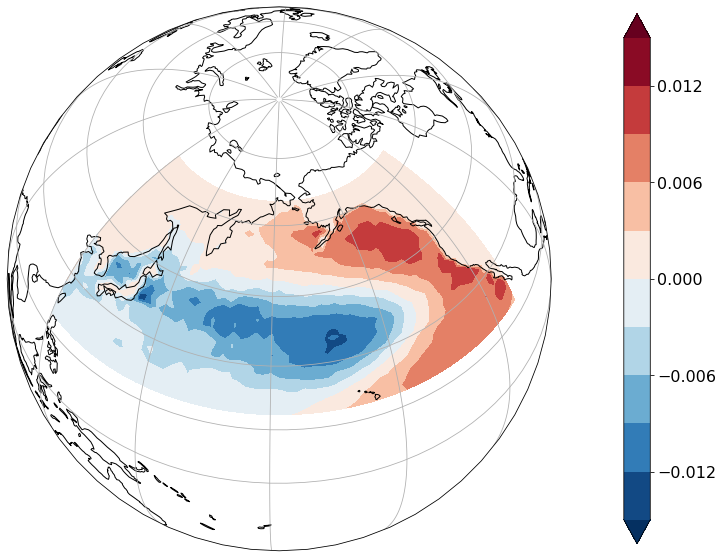

In [17]:
lat_all = -89.25 + 1.5 * np.arange(120)
lat_atl = lat_all[72 : 104]

lon_all = -180 + 2 * np.arange(180)
lon_atl = lon_all[np.append(np.arange(150, 180), np.arange(0, 35))]


m = ccrs.Orthographic(central_longitude=-178.0, central_latitude=48.75)

plt.figure(figsize=(13, 13))
plt.rc('font', size=16)
ax = plt.axes(projection=m)
ax.set_global()
ax.coastlines()
gl = ax.gridlines(draw_labels=False)
gl.xlocator = mticker.FixedLocator(np.arange(-180, 180, 30))
gl.ylocator = mticker.FixedLocator(np.arange(0, 90, 15))
LON_atl = np.zeros_like(eofs.reshape(32, 65))
LAT_atl = np.zeros_like(eofs.reshape(32, 65))
LON_atl[:, :] = lon_atl.reshape(1, -1)
LAT_atl[:, :] = lat_atl.reshape(-1, 1)
lonlats = m.transform_points(ccrs.PlateCarree(), LON_atl, LAT_atl)
cf = ax.contourf(lonlats[:, :, 0], lonlats[:, :, 1], eofs.reshape(32, 65), transform=m, cmap='RdBu_r', 
                 levels=np.linspace(-0.015, 0.015, 11), extend='both')
plt.colorbar(cf, ax=ax, shrink=0.75, pad=0.1)
plt.savefig('contents/eof.eps', bbox_inches='tight')
plt.show()

In [18]:
def calculate_pdo(data, eofs):
    pdo = []
    for curr_month in data:
        pdo.append(np.dot(eofs, curr_month.flatten()))
    return np.array(pdo)

In [19]:
pdo = calculate_pdo(ocean.reshape(504, 32, 65), eofs)

In [20]:
data = np.fromfile('data/ERA5/TS.STD', dtype=np.float32).reshape(42, 12, 120, 180).astype('float64')
set_minimum_water_to_zero(data)
substract_monthly_mean(data)

In [21]:
ind_min = pdo.argmin()
data_pdo_min = data[ind_min // 12][ind_min % 12]

In [22]:
ind_min // 12, ind_min % 12

(41, 9)

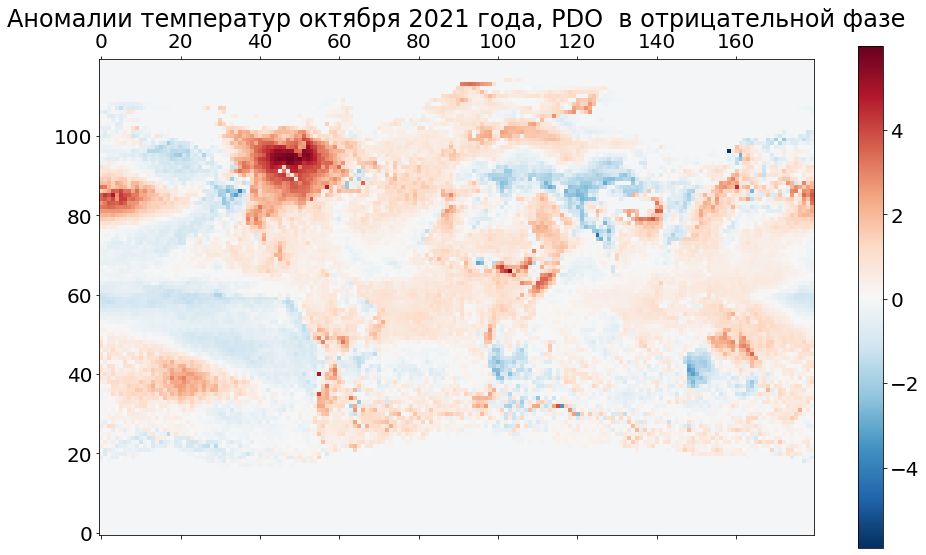

In [23]:
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(16,9))
plt.matshow(data_pdo_min, fignum=1, origin='lower', cmap='RdBu_r')
plt.colorbar()
plt.title('Аномалии температур октября 2021 года, PDO  в отрицательной фазе')
plt.savefig('contents/october2021_anomalies.eps', bbox_inches='tight')

In [24]:
ind_max = pdo.argmax()
data_pdo_max = data[ind_max // 12][ind_max % 12]
ind_max // 12, ind_max % 12

(17, 5)

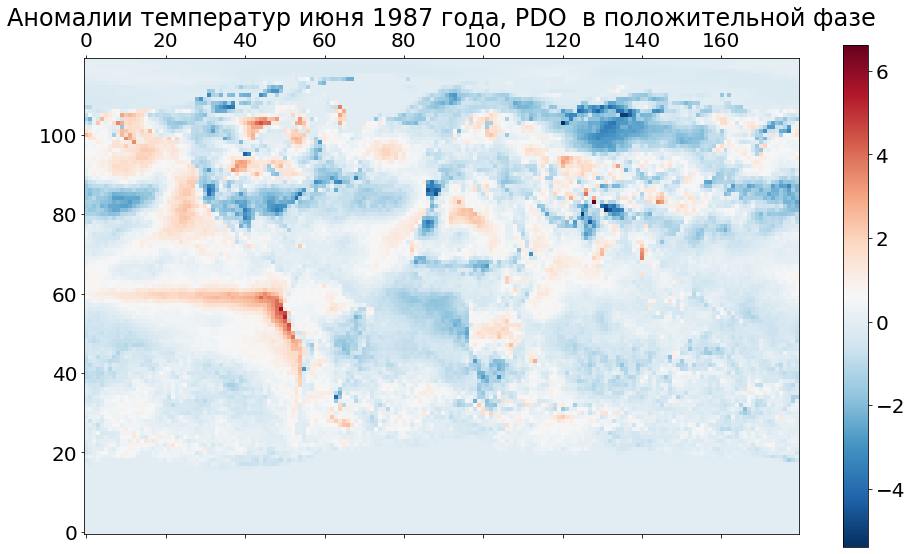

In [25]:
plt.figure(figsize=(16,9))
plt.matshow(data_pdo_max, fignum=1, origin='lower', cmap='RdBu_r')
plt.colorbar()
plt.title('Аномалии температур июня 1987 года, PDO  в положительной фазе')
plt.savefig('contents/june1987_anomalies.eps', bbox_inches='tight')

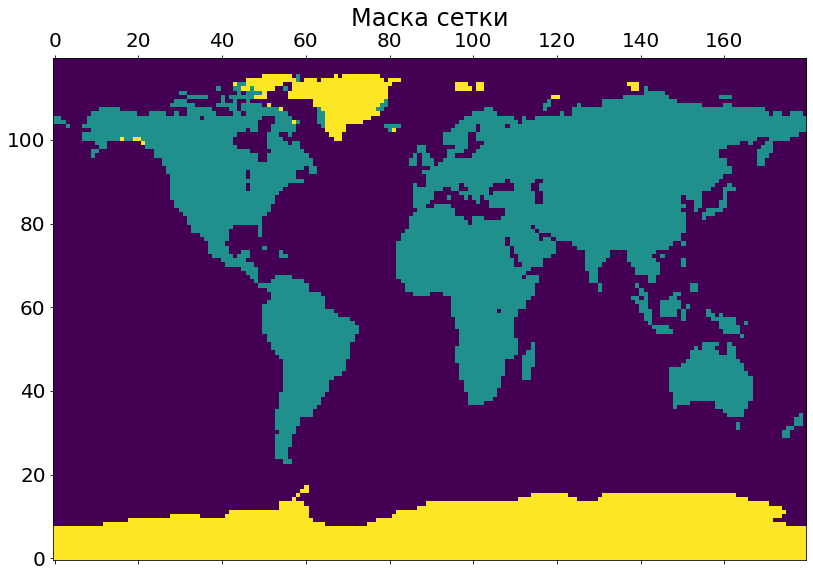

In [26]:
plt.figure(figsize=(16,9))
plt.matshow(mask, fignum=1, origin='lower')
plt.title('Маска сетки')
plt.savefig('contents/mask.eps', bbox_inches='tight')

In [27]:
pdo.min(), pdo.max(), pdo.mean()

(-7.349781014747956, 8.534050831606024, -2.7068294695622863e-15)

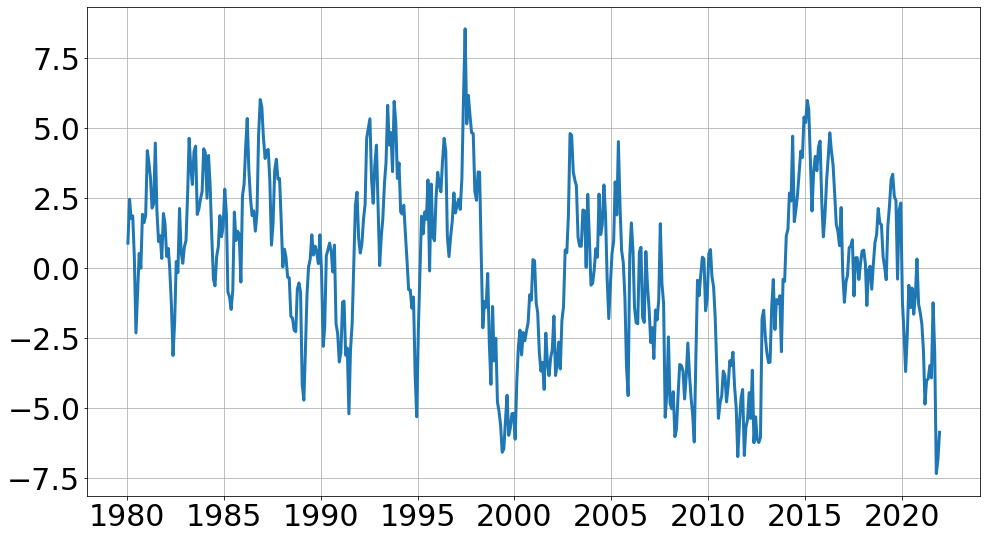

In [28]:
#plot PDO
plt.rcParams.update({'font.size': 30})
# dates
start_date = datetime(1980, 1, 16)
end_date = datetime(2021, 12, 16)
 
dates = []

for dt in rrule.rrule(rrule.MONTHLY, dtstart=start_date, until=end_date):
    dates.append(dt)
dates = np.array(dates)

plt.figure(figsize=(16,9))
#plt.axhline(0, color='black', linestyle='--')
plt.plot(dates, pdo, linewidth=3)
#plt.xticks(dates[::36], rotation=45)
#plt.title('Индекс PDO полученный из данных реанализа ERA5 за 1980-2021 г.')
plt.grid()

plt.savefig('contents/pdo.eps', bbox_inches='tight')
plt.show()

In [29]:
pdo.tofile('data/pdo.std')
eofs.tofile('data/eof.std')

### Hindcasts for first years

In [30]:
ocean = []
for i in range(42):
    year = i + 1980
    curr_data = np.fromfile('data/HINDCASTS/TS' + str(year) + '.STD', dtype=np.float32).reshape(62, 10, 120, 180)

    #curr_data = curr_data[:, [0,1,2,4,5,6,8,9], :, :]
    
    curr_data = curr_data.mean(axis=1)
    for j in range(12):
        ocean.append(curr_data[j])
ocean = np.array(ocean)
ocean = ocean.reshape((42, 12, 120, 180))
ocean = ocean.astype('float64')

In [31]:
ocean = prepare_data(ocean, mode='ERA5')

In [32]:
pdo_true = pdo[10 :]

In [33]:
pdo_curr = calculate_pdo(ocean.reshape(504, 32, 65),  eofs)

In [34]:
pdo_curr = pdo_curr[:-10]

In [35]:
pdo_curr.min(), pdo_curr.max(), pdo_curr.mean()

(-6.425544190772496, 6.239273011960357, 0.043486469330531866)

In [36]:
np.corrcoef(pdo_curr, pdo_true)

array([[1.        , 0.57445048],
       [0.57445048, 1.        ]])

In [37]:
np.corrcoef(pdo_curr, pdo_true)

array([[1.        , 0.57445048],
       [0.57445048, 1.        ]])

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


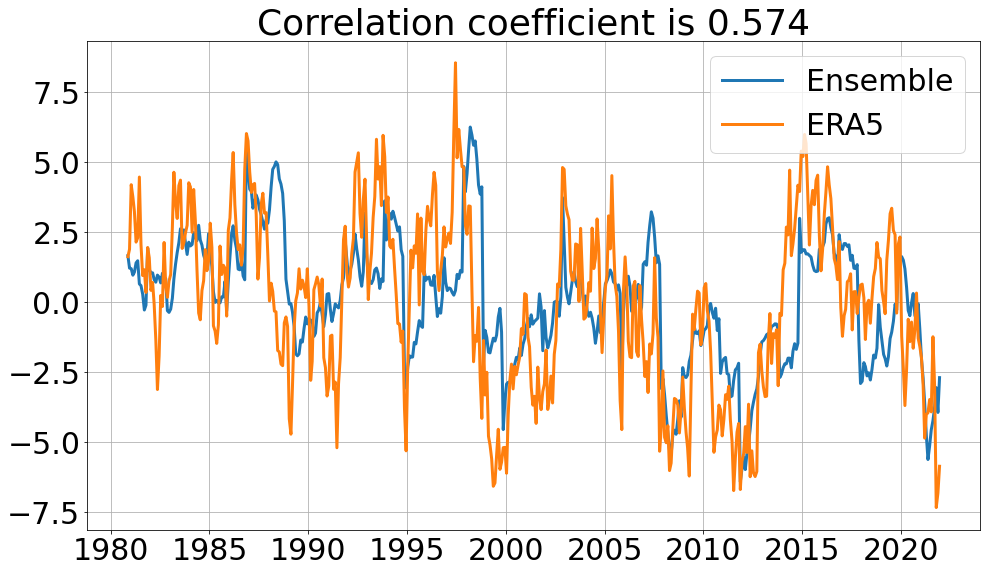

In [38]:
# dates
start_date = datetime(1980, 11, 16)
end_date = datetime(2021, 12, 16)
dates = []
for dt in rrule.rrule(rrule.MONTHLY, dtstart=start_date, until=end_date):
    dates.append(dt)
dates = np.array(dates)

plt.figure(figsize=(16,9))
#plt.axhline(0, color='black', linestyle='--')
plt.plot(dates, pdo_curr, label='Ensemble', linewidth=3)
plt.plot(dates, pdo_true, label='ERA5', linewidth=3)
plt.title(f'Correlation coefficient is {np.corrcoef(pdo_curr, pdo_true)[0, 1]:.3}')
plt.legend()
#plt.xticks(dates[::24], rotation=45)
plt.grid()
plt.savefig('contents/pdo_first_year.eps', bbox_inches='tight')
plt.show()

In [39]:
def plot_month(pdo_true, pdo_curr, start_ind, month, plot_all=False, start_date=datetime(1980, 11, 16), end_date=datetime(2021, 12, 16)):
    dates = []
    for dt in rrule.rrule(rrule.MONTHLY, dtstart=start_date, until=end_date):
        dates.append(dt)
    dates = np.array(dates)

    plt.figure(figsize=(16,9))
    #plt.axhline(0, color='black', linestyle='--')

    if plot_all:
        plt.plot(dates, pdo_curr, label='Данные модели')
        plt.plot(dates, pdo_true, label='Данные из ERA5')

    dates = dates[start_ind : : 12]
    pdo_curr_month = pdo_curr[start_ind : : 12]
    pdo_true_month = pdo_true[start_ind : : 12]

    plt.plot(dates, pdo_curr_month, label=f'{month} модели')
    plt.plot(dates, pdo_true_month, label=f'{month} из ERA5')

    plt.title(f'Коэффициент корреляции за {month} равен {np.corrcoef(pdo_curr_month, pdo_true_month)[0, 1]:.3}')
    plt.legend()
    plt.grid()
    #plt.xticks(dates, rotation=45)
    plt.savefig(f'contents/first_year_plots/plot_{month}.eps', bbox_inches='tight')
    plt.show()


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


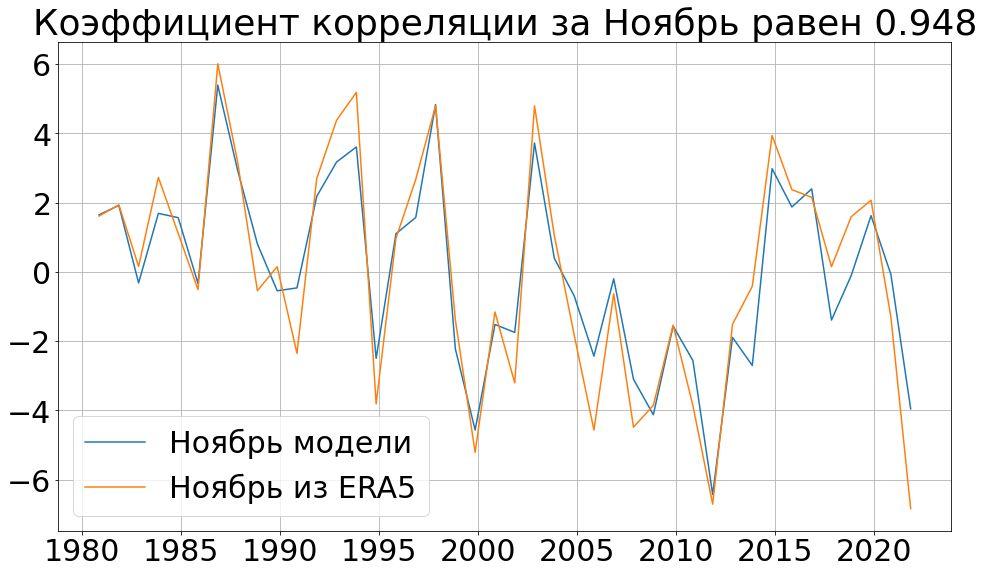

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


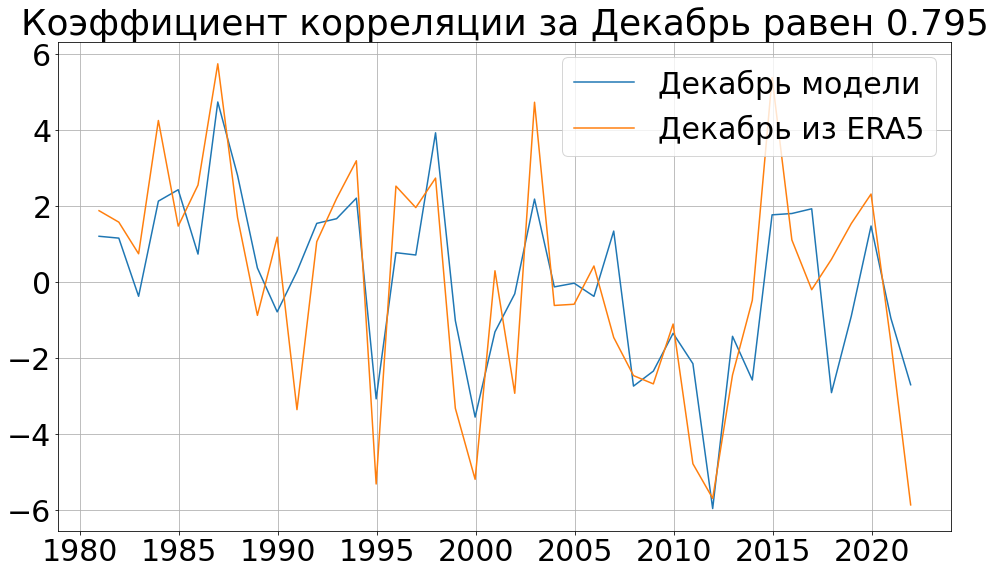

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


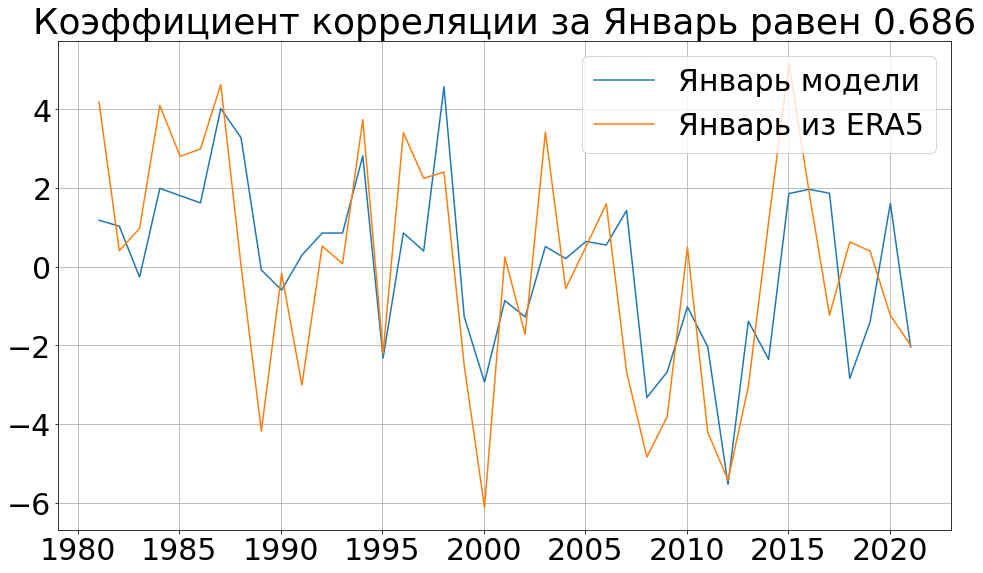

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


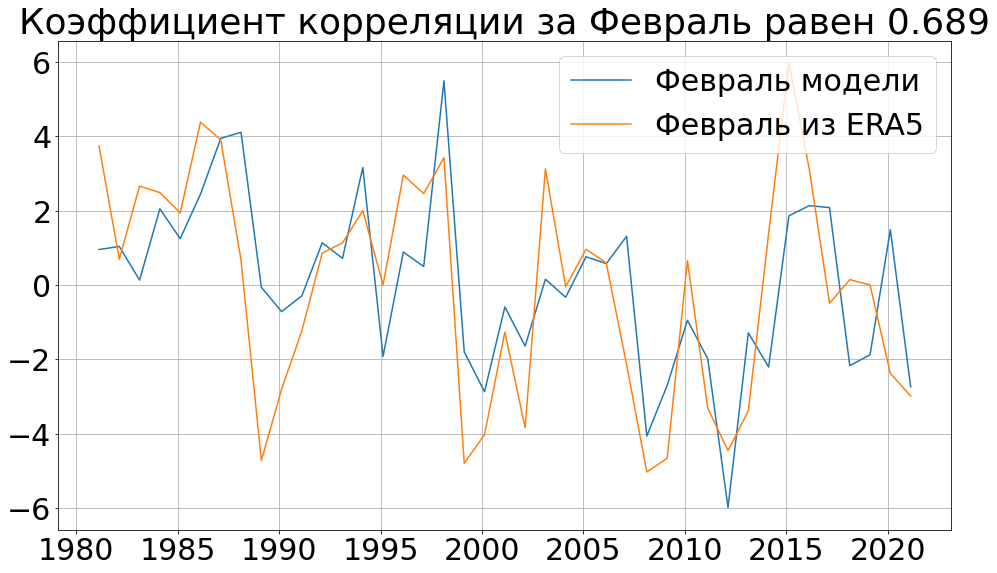

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


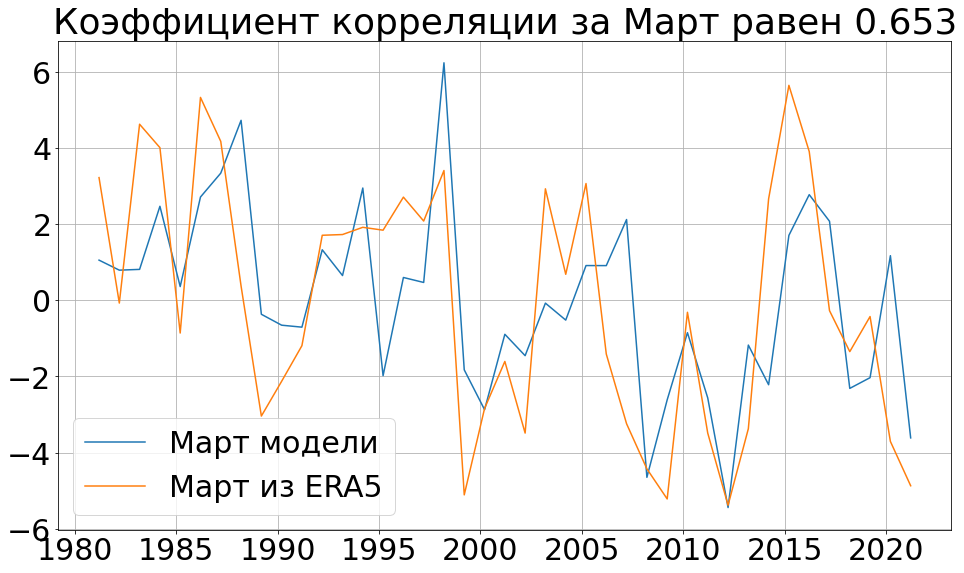

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


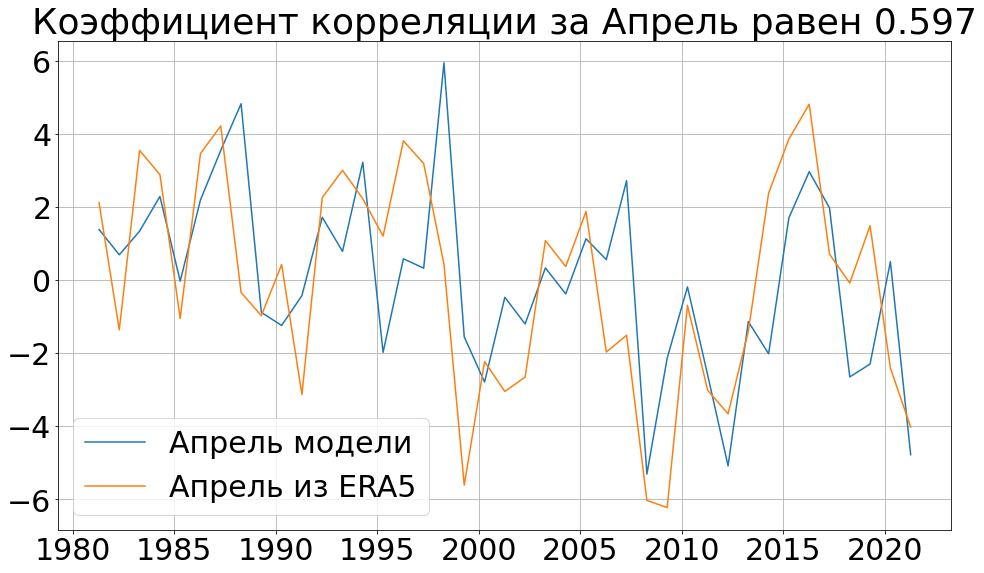

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


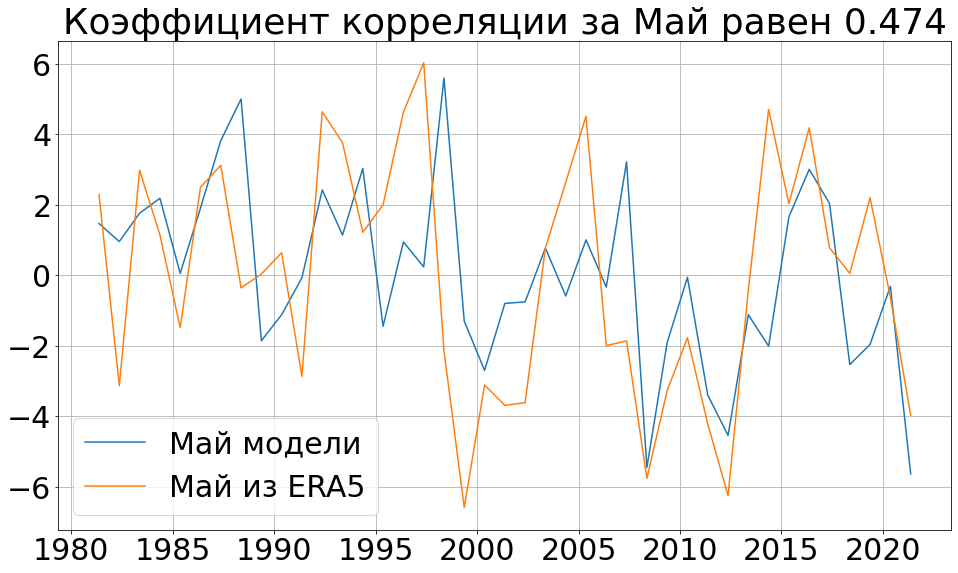

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


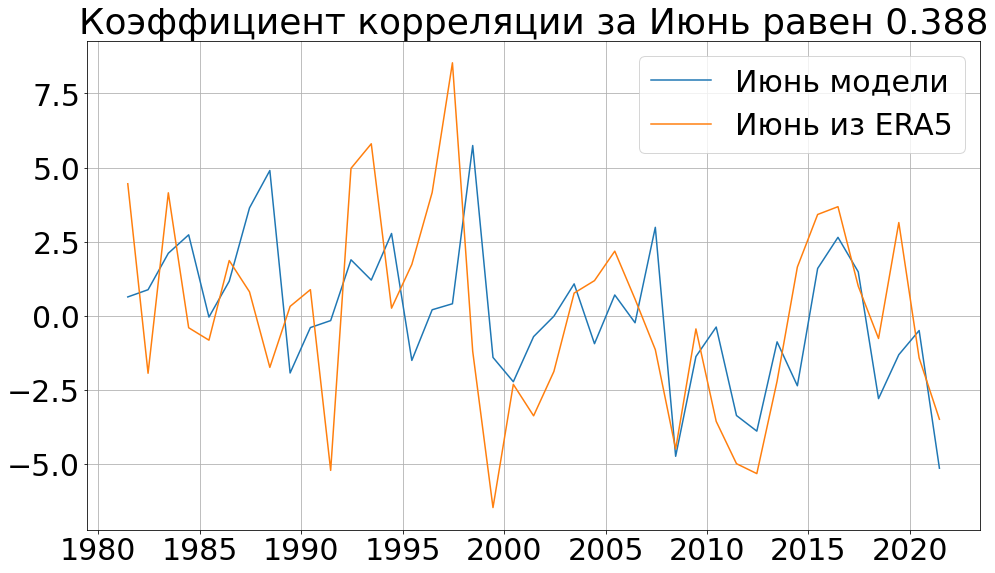

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


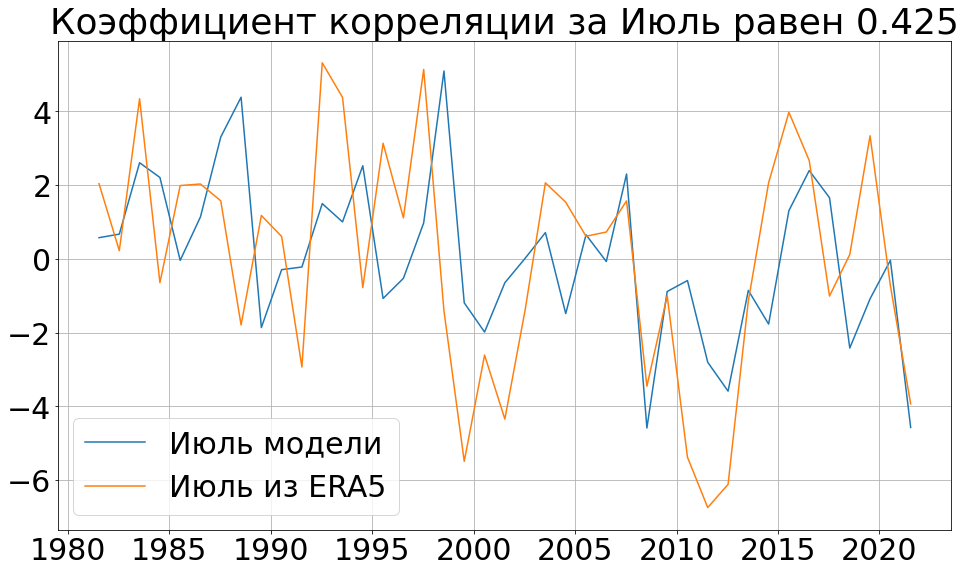

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


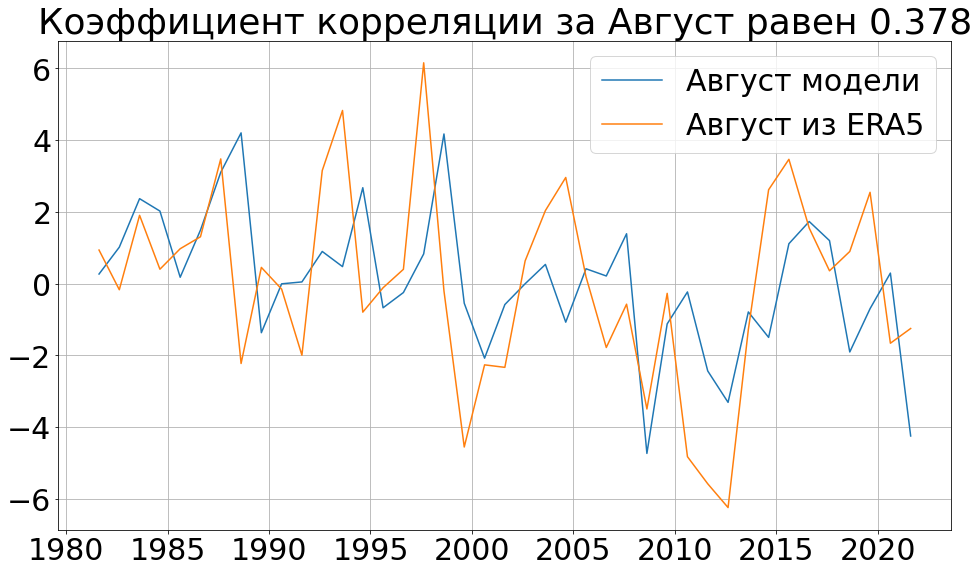

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


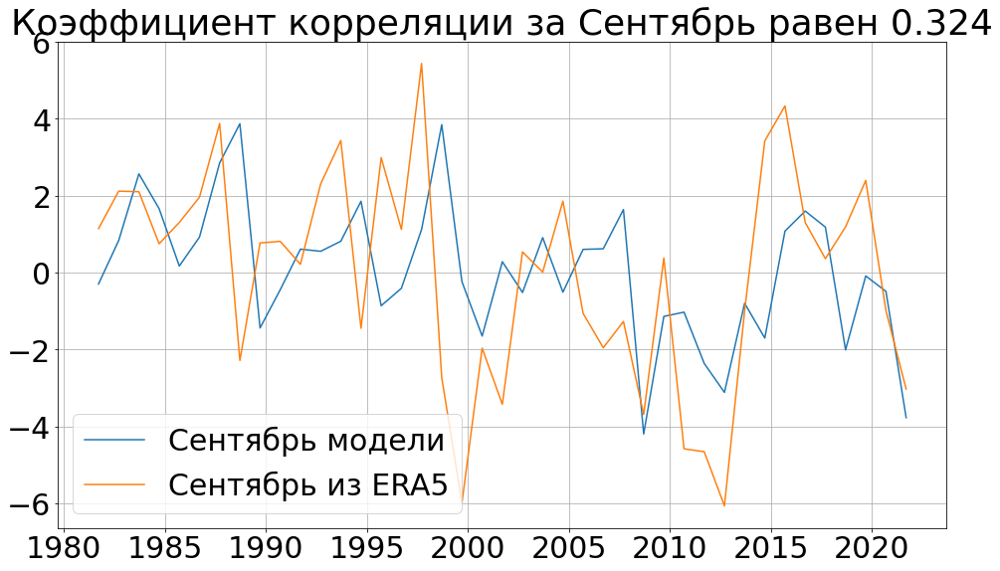

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


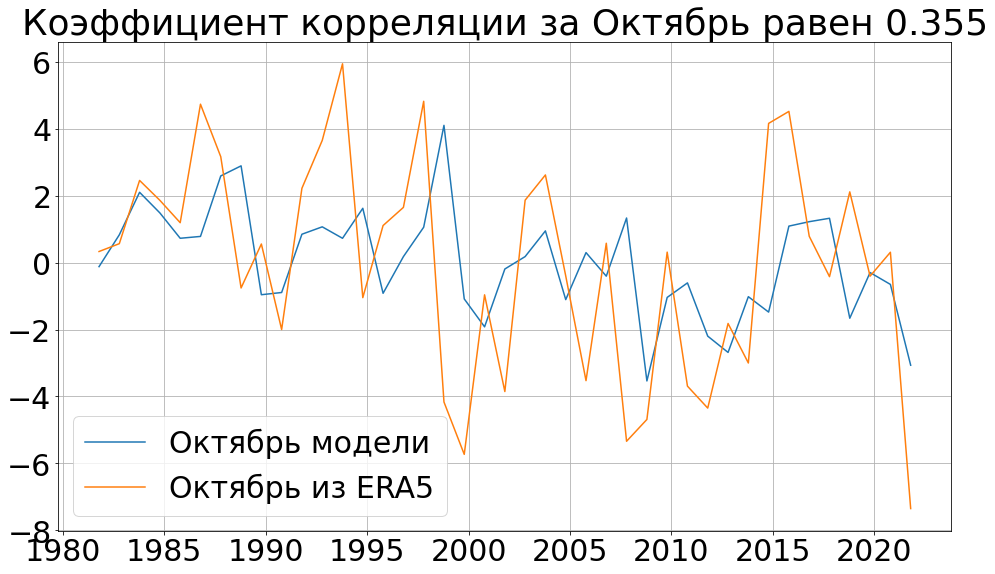

In [40]:
months = {
    0 : 'Ноябрь',
    1 : 'Декабрь',
    2 : 'Январь',
    3 : 'Февраль',
    4 : 'Март',
    5 : 'Апрель',
    6 : 'Май',
    7 : 'Июнь',
    8 : 'Июль',
    9 : 'Август',
    10 : 'Сентябрь',
    11 : 'Октябрь',
}

for i in range(12):
    plot_month(pdo_true, pdo_curr, i, months[i], False)    

In [41]:
correlation = []
for i in range(12):
    pdo_curr_month = pdo_curr[i : : 12]
    pdo_true_month = pdo_true[i : : 12]
    correlation.append(np.corrcoef(pdo_curr_month, pdo_true_month)[0][1])

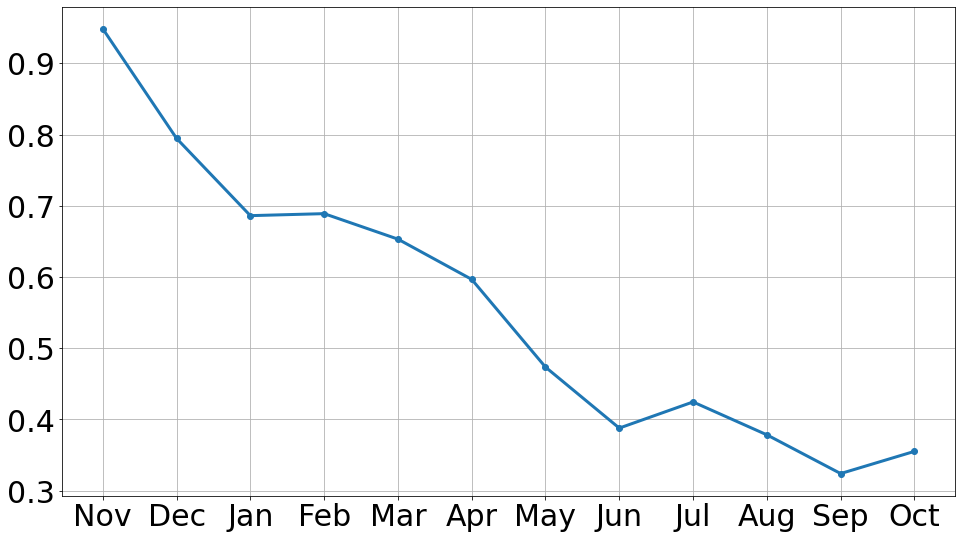

In [42]:
plt.figure(figsize=(16,9))
xtics = ['Nov', 'Dec', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct']
plt.plot(xtics, correlation, linewidth=3, marker='o')
#plt.title('Зависимость коэффициента корреляции от месяца')
#plt.xlabel('Месяц')
#plt.ylabel('Коэффициент корреляции')
plt.grid()
plt.savefig('contents/first_year_plots/months_correlation.eps', bbox_inches='tight')
plt.show()

In [43]:
correlation

[0.9484574633153722,
 0.7945961586321154,
 0.6861446225661089,
 0.6889558360958572,
 0.6531829569164793,
 0.5966884365558928,
 0.4735400258638728,
 0.3879030803843923,
 0.42461780961601137,
 0.3784612514056246,
 0.32407338509658296,
 0.35521368941983467]

### PDO by 5 years

In [44]:
pdo_true = np.fromfile('data/pdo.std')
eofs = np.fromfile('data/eof.std')

In [45]:
pdo_true = pdo_true.reshape(42, 12)
pdo_true = pdo_true.mean(axis=1)

In [46]:
years = []
for i in range(42):
    year = i + 1980
    curr_years = []
    curr_data = np.fromfile('data/HINDCASTS/TS' + str(year) + '.STD', dtype=np.float32).reshape(62, 10, 120, 180)
    curr_data = curr_data.mean(axis=1)
    for j in range(5):
        curr_year = curr_data[j * 12 + 2 : j * 12 + 2 + 12, :, :]
        curr_years.append(curr_year)
    years.append(curr_years)
years = np.array(years)
years = years.astype('float64')
        

In [47]:
years = prepare_data(years, mode='Models')

In [48]:
def plot_year_mean(years, start_year, pdo_true):
    curr_years = np.array([years[j][start_year] for j in range(42)])
    years_pdo = [None for _ in range(42)]
    for j in range(42):
        years_pdo[j] = calculate_pdo(curr_years[j], eofs)
    years_pdo = np.array(years_pdo).mean(axis=1)

    # dates
    start_date = datetime(1980 + start_year + 1, 1, 16)
    end_date = datetime(2021, 12, 16)
    dates = []
    for dt in rrule.rrule(rrule.YEARLY, dtstart=start_date, until=end_date):
        dates.append(dt)
    dates = np.array(dates)

    # years_pdo: (1980 + start_year + 1) -- (2021 + start_year + 1)
    # pdo_true:  1980 -- 2021
    curr_pdo = years_pdo[:-(start_year + 1)]
    curr_pdo_true = pdo_true[start_year + 1:]
    
    corrcoef = np.corrcoef(curr_pdo, curr_pdo_true)[0][1]
    
    plt.figure(figsize=(16,9))
    plt.axhline(0, color='black', linestyle='--')
    plt.plot(range(1980 + start_year + 1, 2022), curr_pdo, label='Данные модели')
    plt.plot(range(1980 + start_year + 1, 2022), curr_pdo_true, label='Данные из ERA5')
    plt.title(f'{i + 1}-й год прогноза.\nКоэффициент корреляции равен {corrcoef:.3}')
    plt.legend()
    plt.grid()
    #plt.xticks(range(1980 + start_year + 1, 2022), rotation=45)
    plt.savefig(f'contents/pdo_by_year_plots/mean_year_{start_year + 1}_pdo.eps', bbox_inches='tight')
    plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


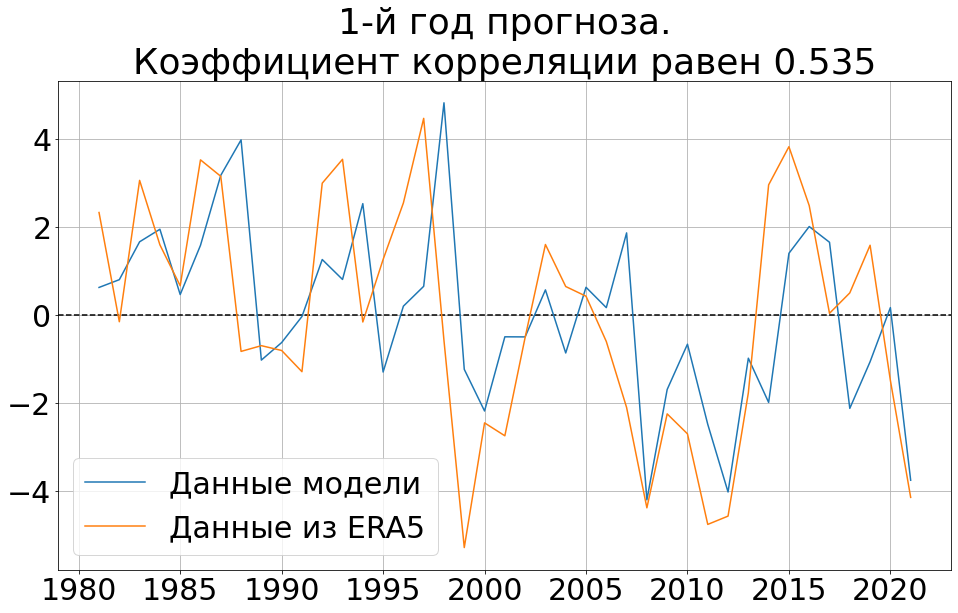

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


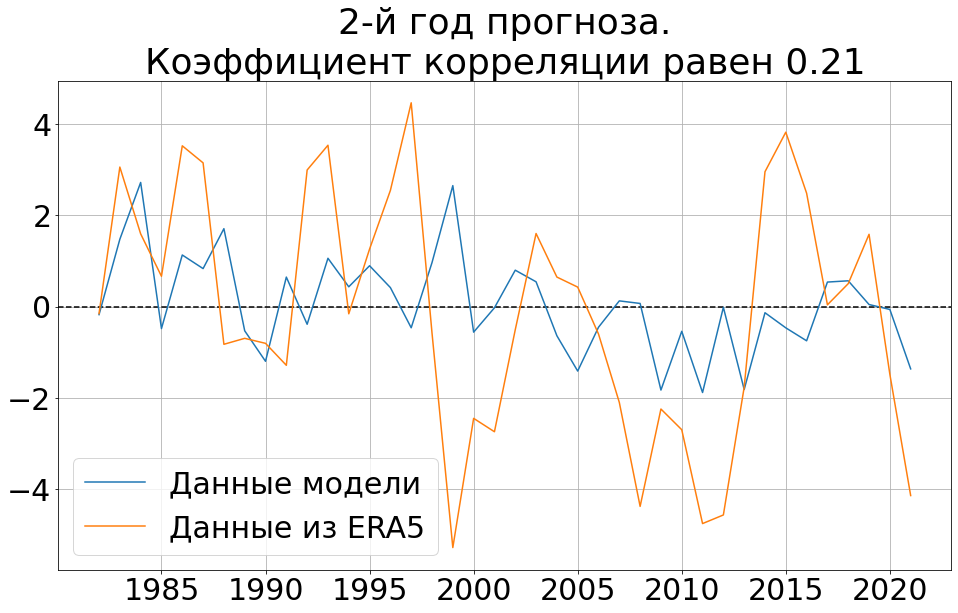

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


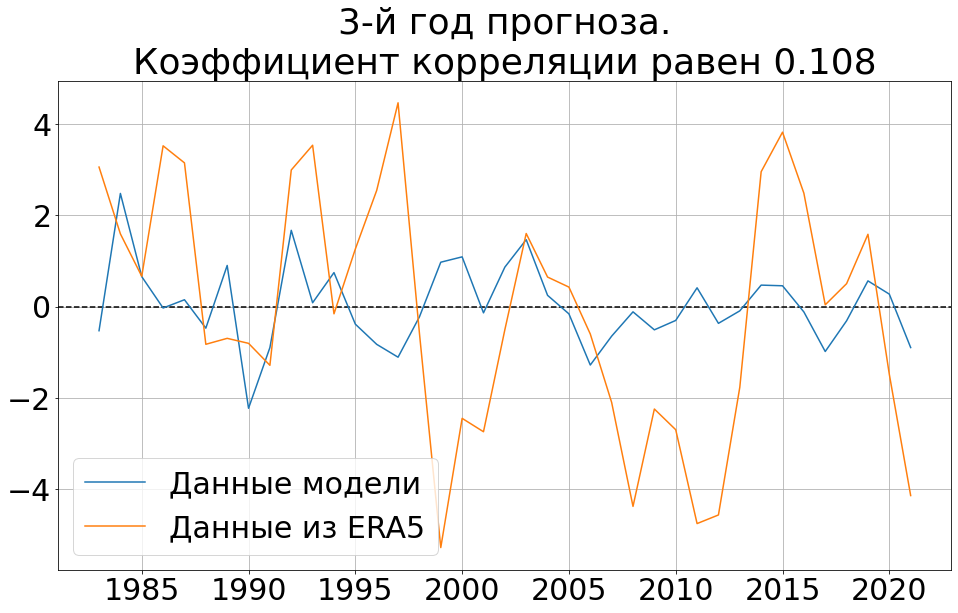

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


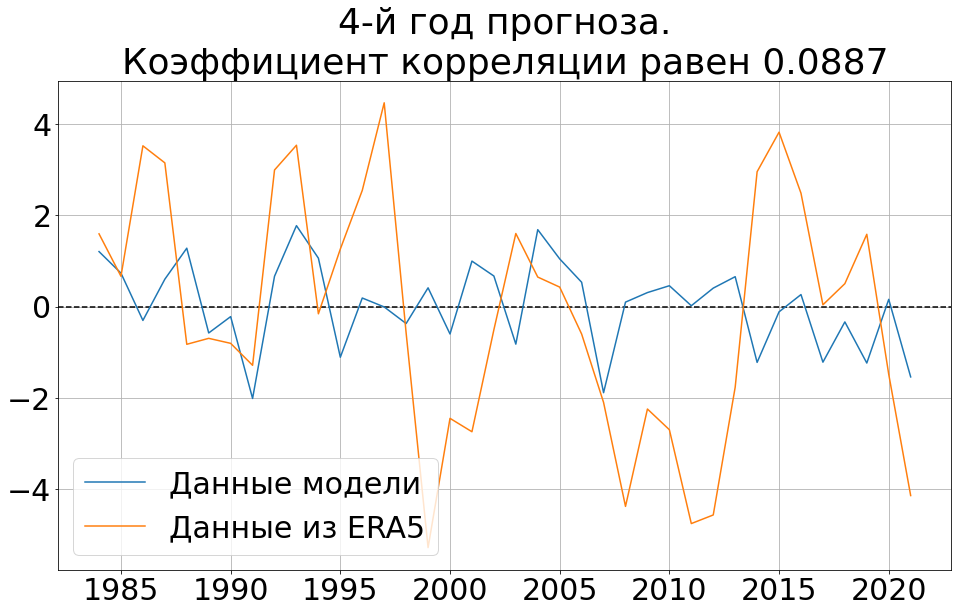

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


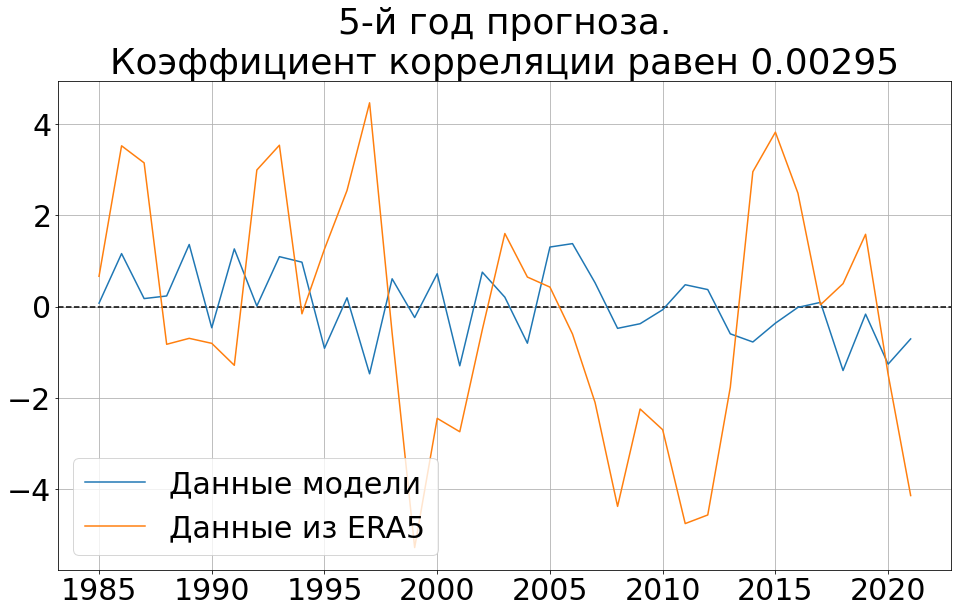

In [49]:
for i in range(5):
    plot_year_mean(years, i, pdo_true)

In [50]:
def plot_5years(years, pdo_true):
    curr_years = []
    for i in range(42):
        curr_years.append(years[i].mean(axis=0))
    curr_years = np.array(curr_years)
    years_pdo = [None for _ in range(42)]
    for j in range(42):
        years_pdo[j] = calculate_pdo(curr_years[j], eofs)
        
    years_pdo = np.array(years_pdo).mean(axis=1) # 1983 - 2024
                                      # pdo_true - 1980 - 2021
    #curr_pdo = years_pdo[:-(1)]
    curr_pdo = years_pdo[:-5] # 1983 - 2021

    print(pdo_true.shape)
    curr_pdo_true = []
    for i in range(37):
        curr_pdo_true.append(pdo_true[i + 1 : i + 1 + 5].mean())
    curr_pdo_true = np.array(curr_pdo_true)
    #curr_pdo_true = pdo_true[3:-2]

    
    print(curr_pdo.shape, '\n', curr_pdo_true.shape)
    
    corrcoef = np.corrcoef(curr_pdo, curr_pdo_true)[0][1]
    
    plt.figure(figsize=(16,9))
    #plt.axhline(0, color='black', linestyle='--')
    plt.plot(range(1983, 2020), curr_pdo, label='Ensemble', linewidth=3)
    plt.plot(range(1983, 2020), curr_pdo_true, label='ERA5', linewidth=3)
    plt.title(f'Correlation coefficient is {corrcoef:.3}')
    plt.legend()
    #plt.xticks(range(1980 + start_year + 1, 2022), rotation=45)
    plt.grid()
    plt.savefig(f'contents/pdo_by_year_plots/mean_year_{15}_pdo.eps', bbox_inches='tight')
    plt.show()

(42,)
(37,) 
 (37,)


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


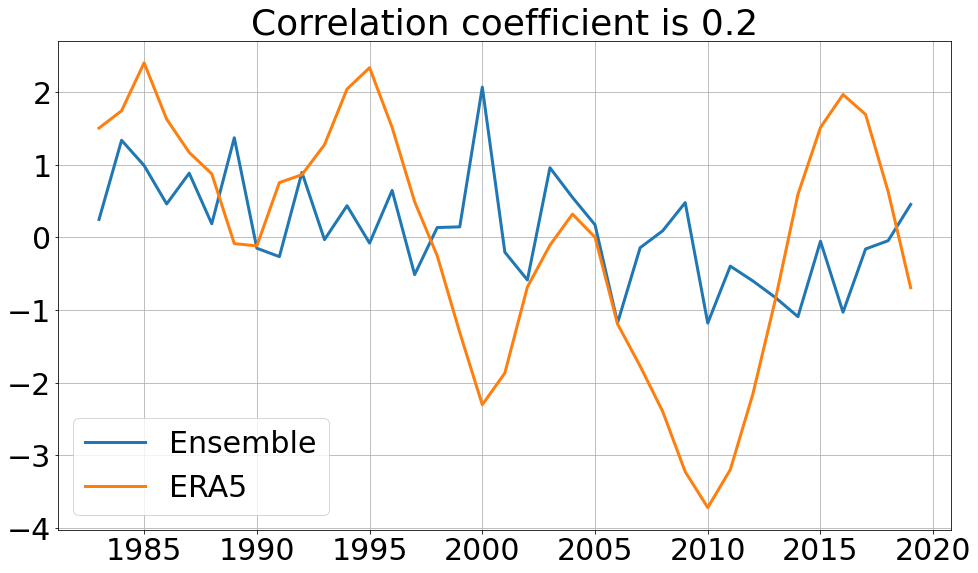

In [51]:
plot_5years(years, pdo_true)

In [52]:
def plot_year_all(years, start_year, pdo_true):
    curr_years = np.array([years[j][start_year] for j in range(42)])
    years_pdo = [None for _ in range(42)]
    for j in range(42):
        years_pdo[j] = calculate_pdo(curr_years[j], eofs)
    years_pdo = np.array(years_pdo).flatten()

    # dates
    start_date = datetime(1980 + start_year + 1, 1, 16)
    end_date = datetime(2021, 12, 16)
    dates = []
    for dt in rrule.rrule(rrule.MONTHLY, dtstart=start_date, until=end_date):
        dates.append(dt)
    dates = np.array(dates)

    curr_pdo = years_pdo[ : -(start_year + 1) * 12]
    curr_pdo_true = pdo_true[(start_year + 1) * 12 :]
    
    corrcoef = np.corrcoef(curr_pdo, curr_pdo_true)[0][1]
    
    plt.figure(figsize=(16,9))
    plt.axhline(0, color='black', linestyle='--')
    plt.plot(dates, curr_pdo, label='Данные модели')
    plt.plot(dates, curr_pdo_true, label='Данные из ERA5')
    plt.title(f'{i + 1}-й год прогноза.\nКоэффициент корреляции равен {corrcoef:.3}')
    plt.legend()
    #plt.xticks(dates[::12], rotation=45)
    plt.savefig(f'contents/pdo_by_year_plots/all_year_{start_year + 1}_pdo.eps')
    plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


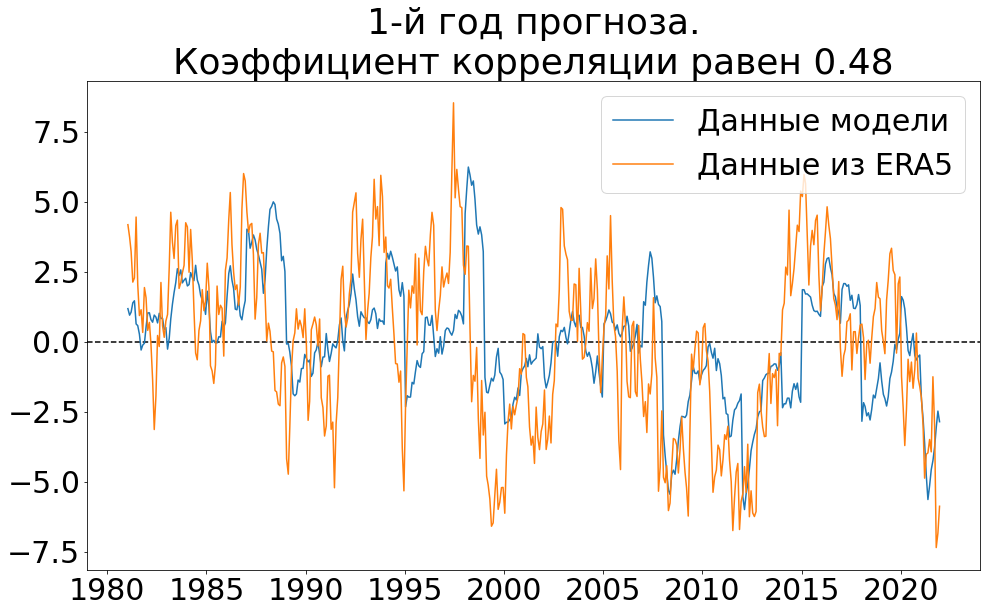

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


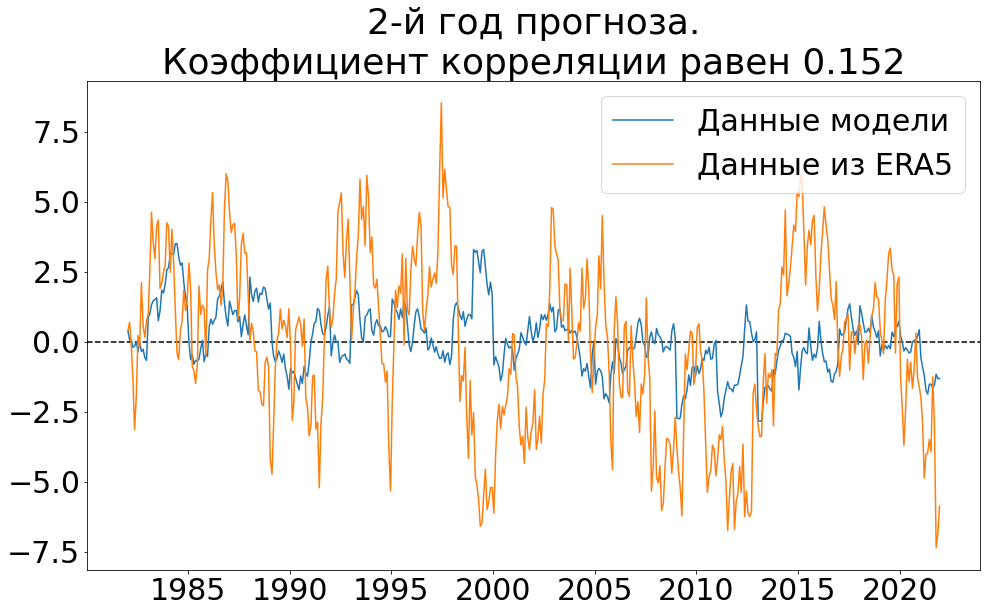

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


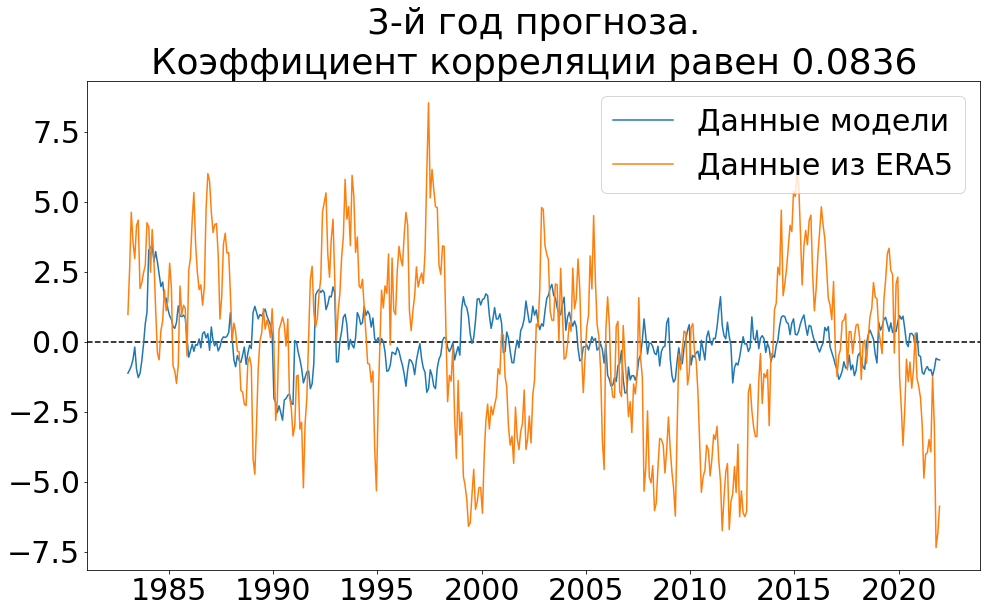

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


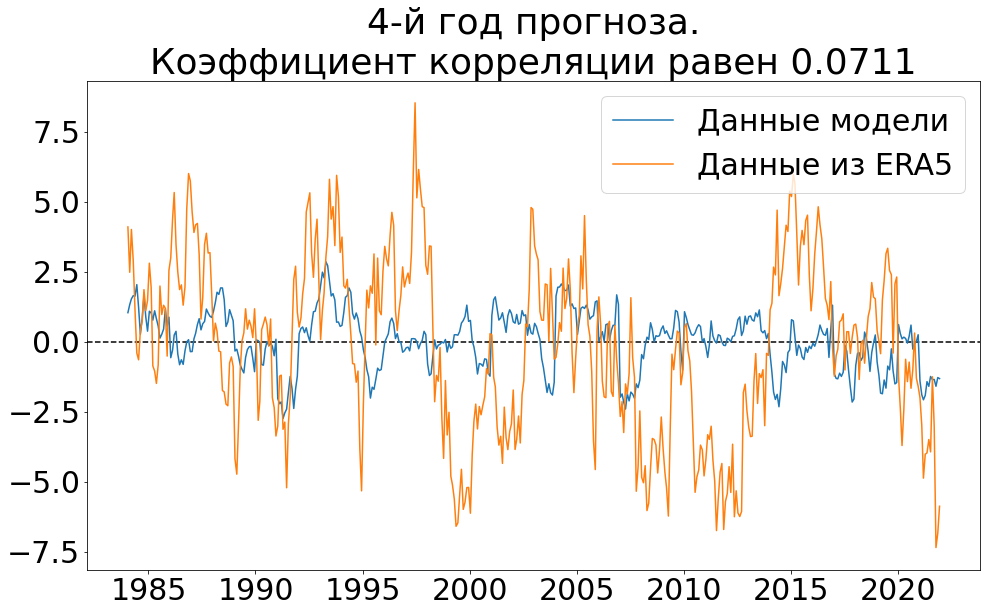

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


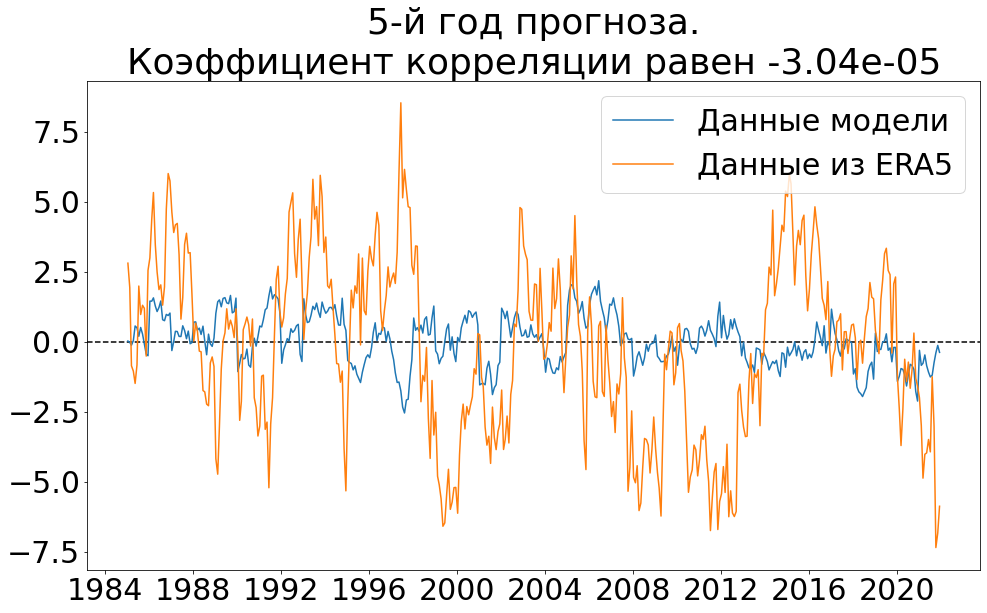

In [53]:
pdo_true = np.fromfile('data/pdo.std')
for i in range(5):
    plot_year_all(years, i, pdo_true)

### Inertial forecast

Индекс PDO во все время прогноза будет таким, как в первый месяц

In [58]:
def plot_inertial_forecast(lag):
    lag += 1
    pdo_true = np.fromfile('data/pdo.std')

    pdo_inertial = np.zeros_like(pdo_true)

    for i in range(len(pdo_true) // lag):
        pdo_inertial[i * lag : (i + 1) * lag] = pdo_true[i * lag]   
    if len(pdo_true) % lag != 0:
        pdo_inertial[(len(pdo_true) // lag) * lag: ] = pdo_true[(len(pdo_true) // lag) * lag] 
        
    # dates
    start_date = datetime(1980, 1, 16)
    end_date = datetime(2021, 12, 16)
    dates = []
    for dt in rrule.rrule(rrule.MONTHLY, dtstart=start_date, until=end_date):
        dates.append(dt)
    dates = np.array(dates)
    
    corrcoef = np.corrcoef(pdo_true, pdo_inertial)[0][1]
    
    plt.figure(figsize=(16,9))
    plt.axhline(0, color='black', linestyle='--')
    plt.plot(dates, pdo_inertial, label='Inertial forecast')
    plt.plot(dates, pdo_true, label='ERA5')
    #plt.xticks(dates[::12], rotation=45)
    plt.title(f'Correlation coefficient is {corrcoef:.3}')
    plt.legend()
    plt.grid()
    plt.savefig(f'contents/pdo_inertial_forecast/inertial_pdo_{lag - 1}.eps', bbox_inches='tight')
    plt.show()

    return corrcoef

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


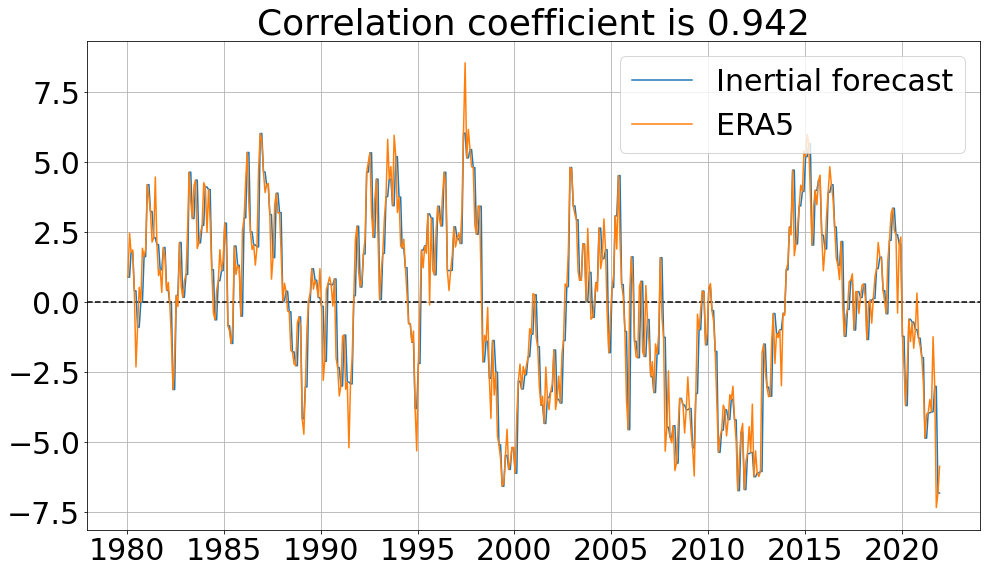

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


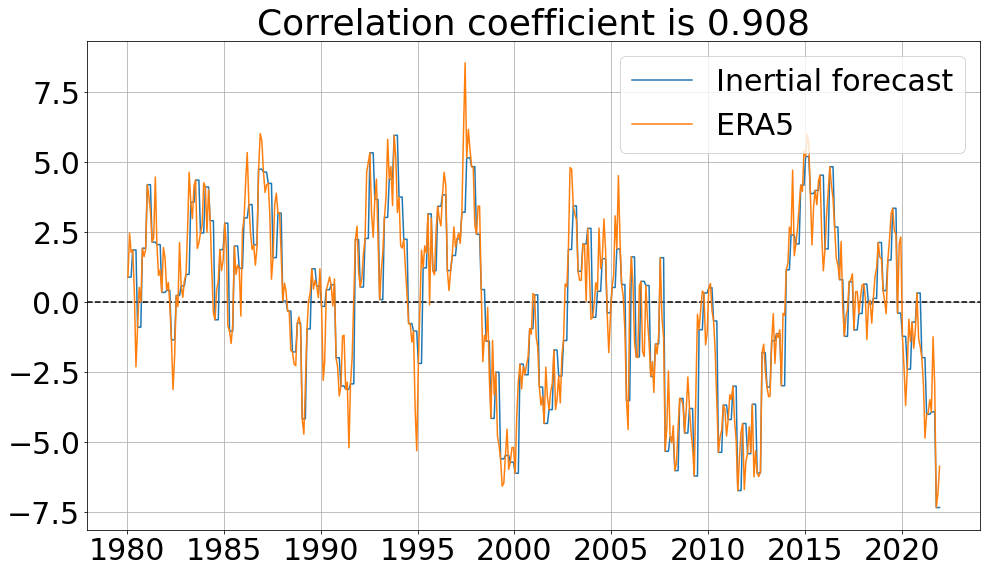

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


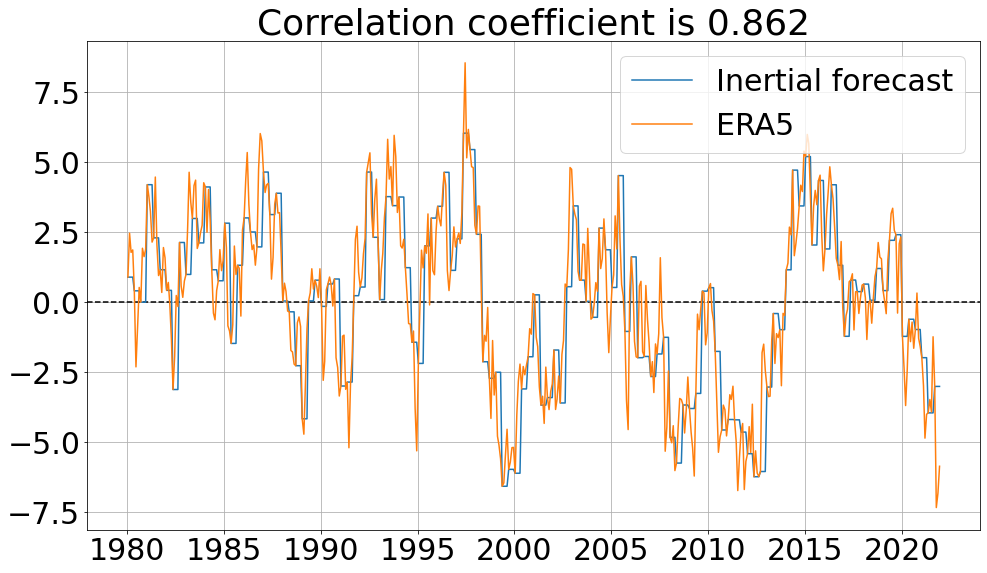

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


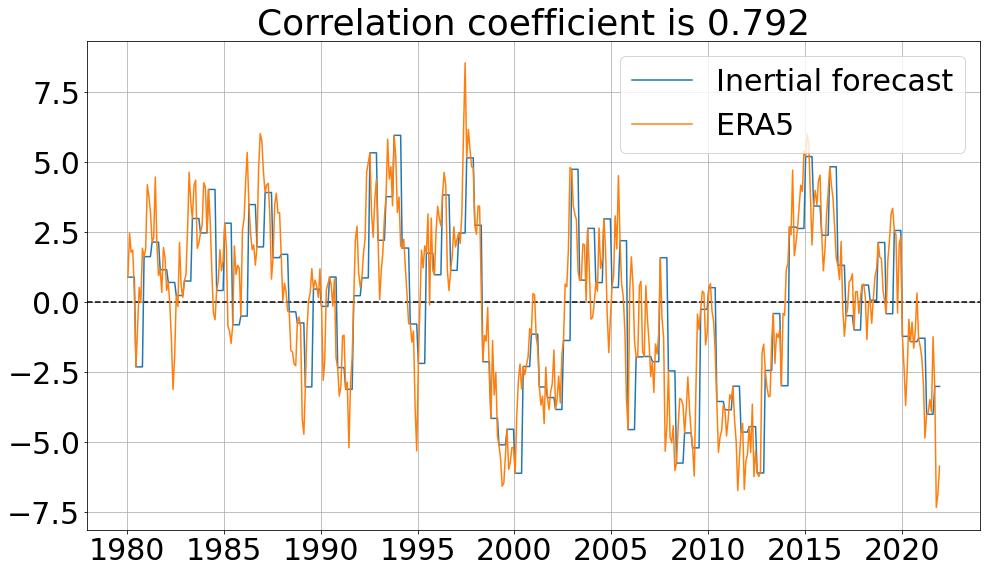

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


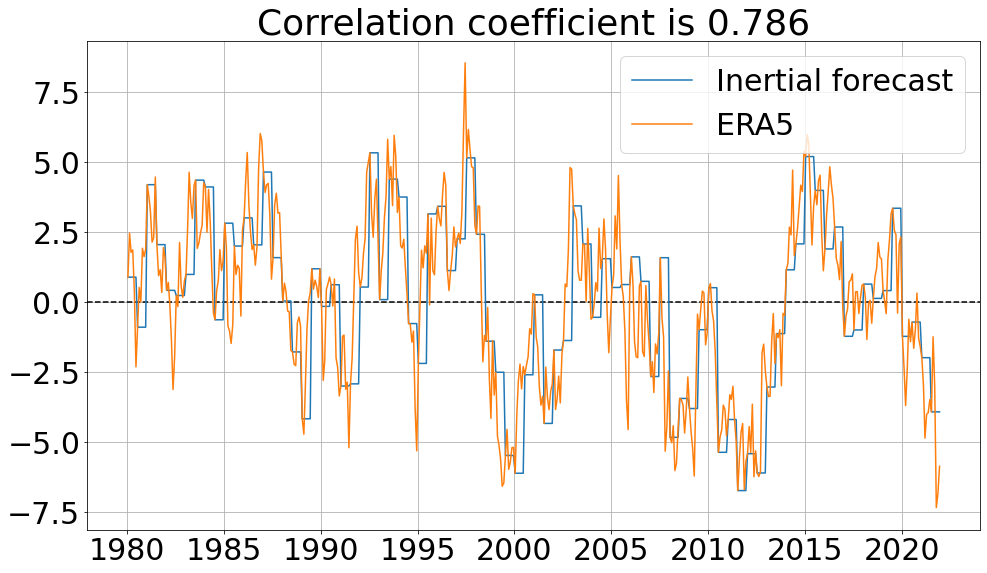

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


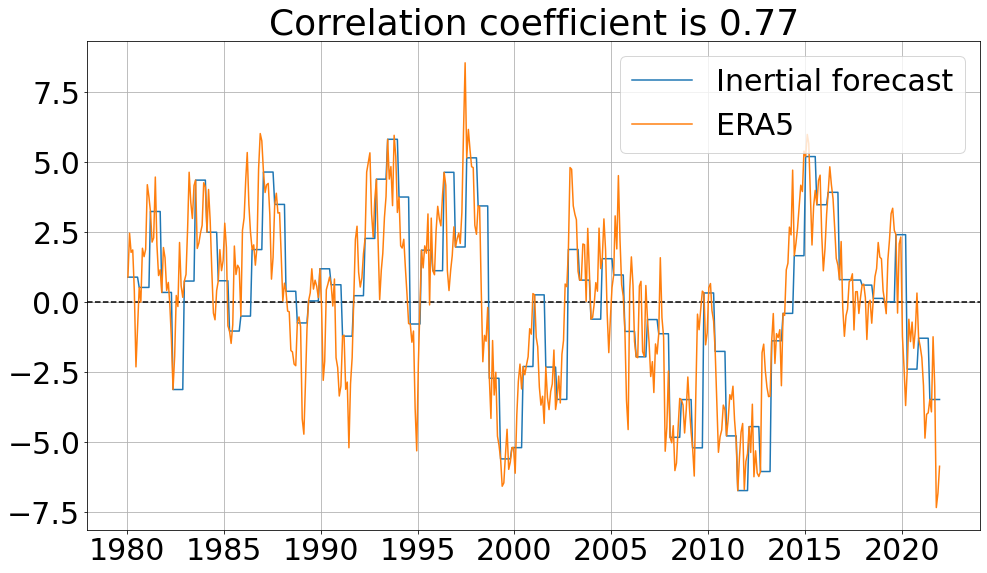

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


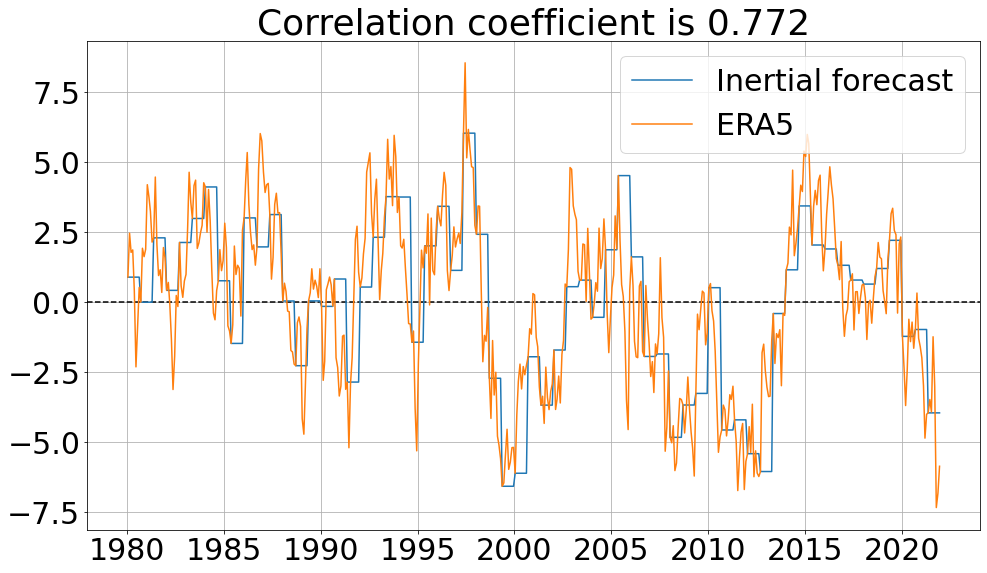

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


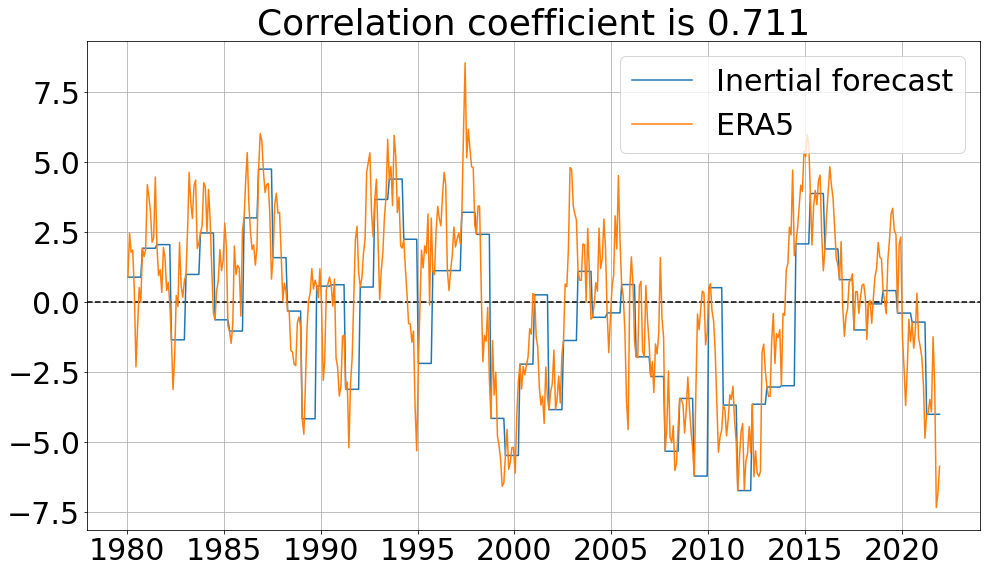

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


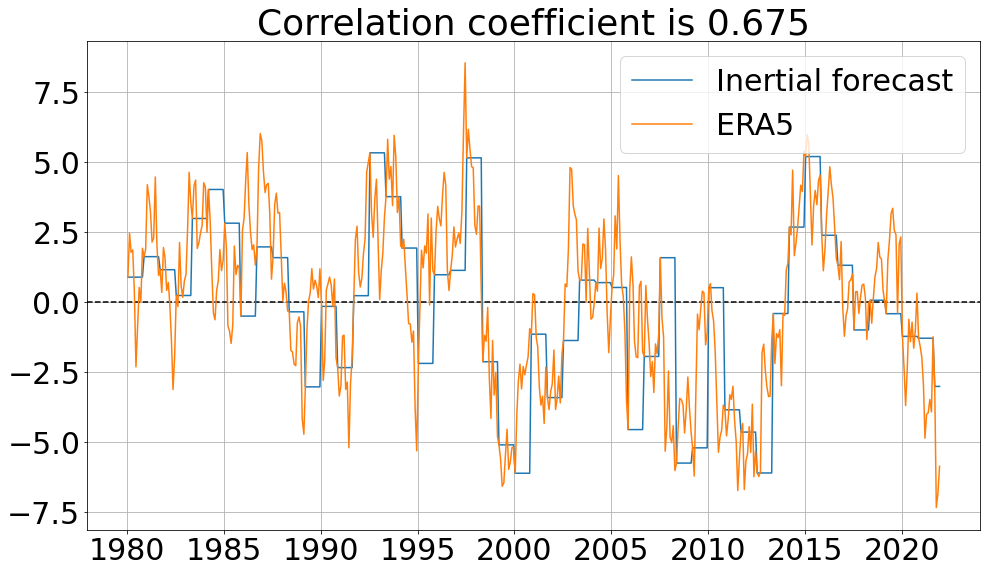

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


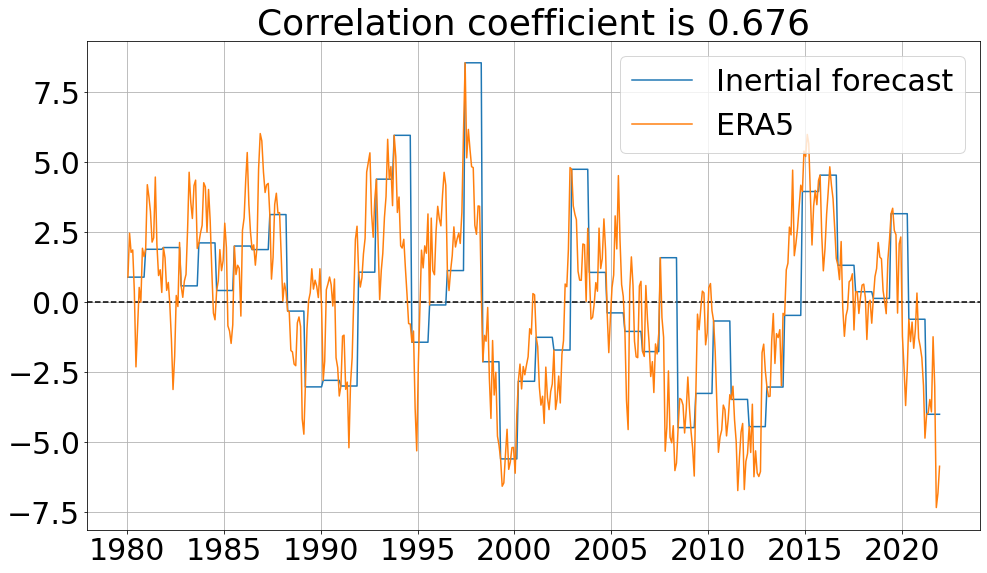

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


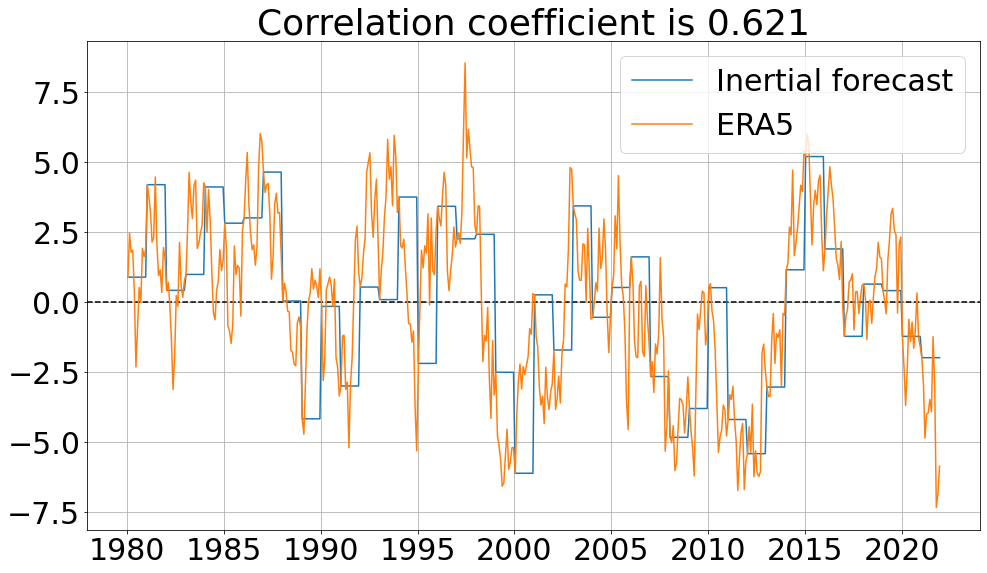

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


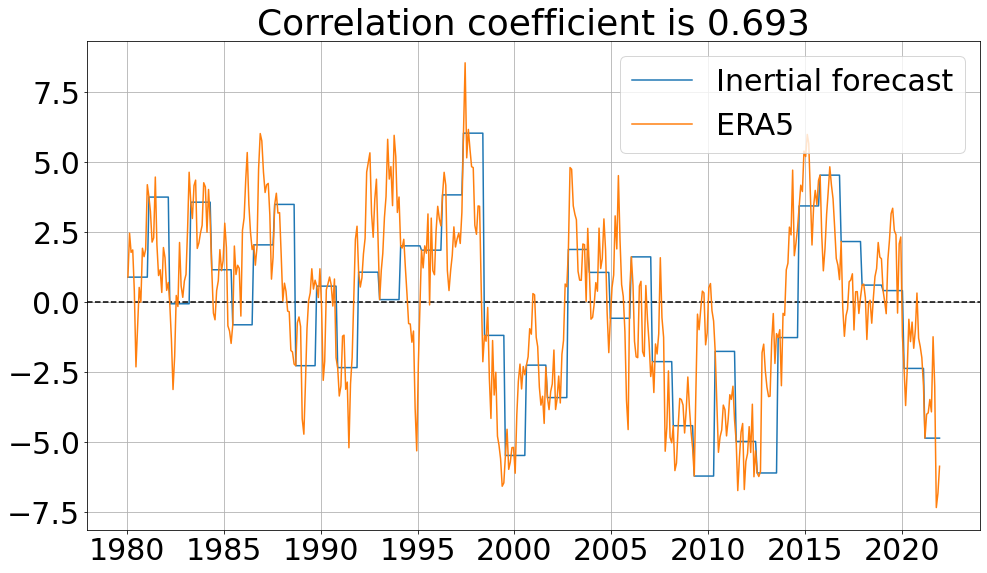

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


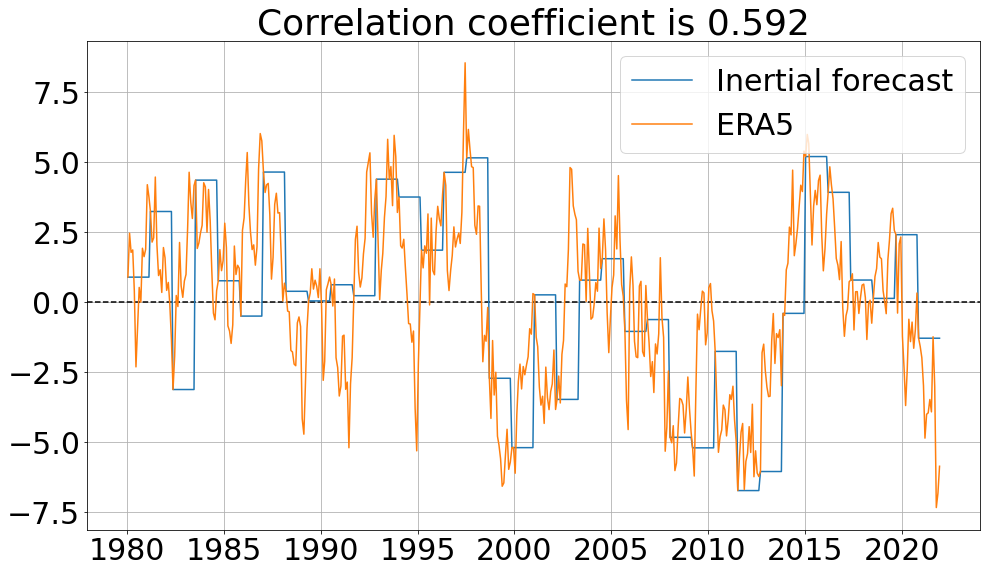

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


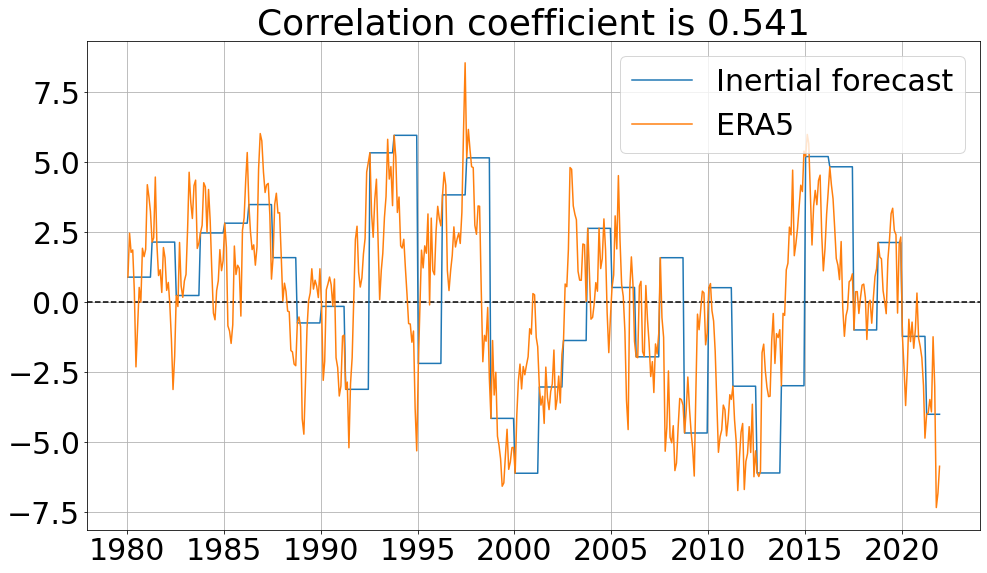

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


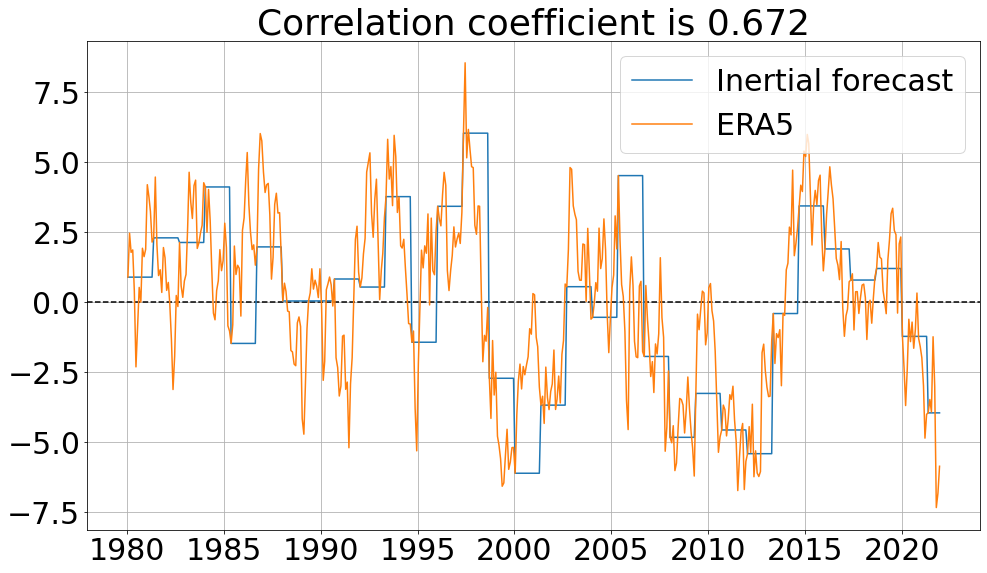

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


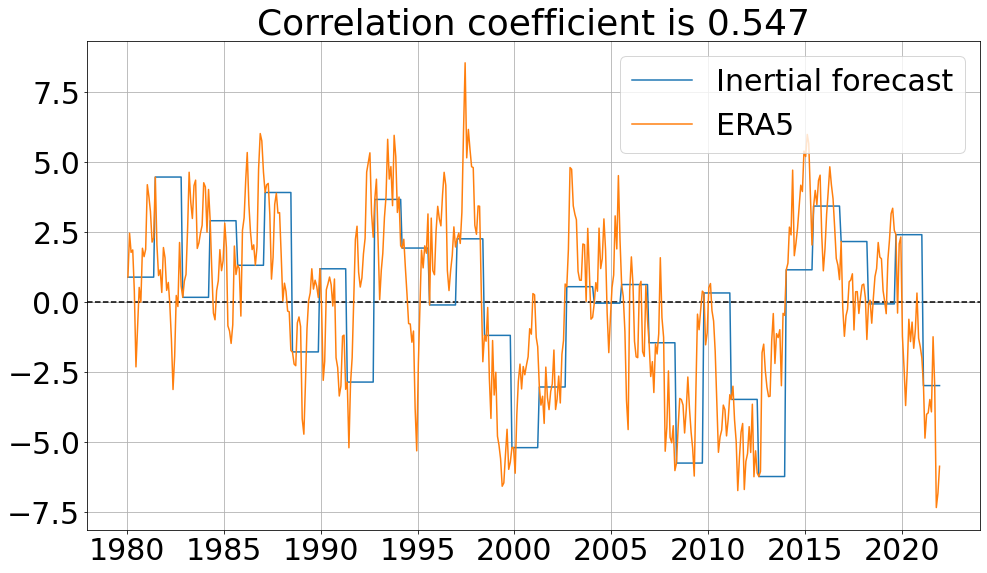

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


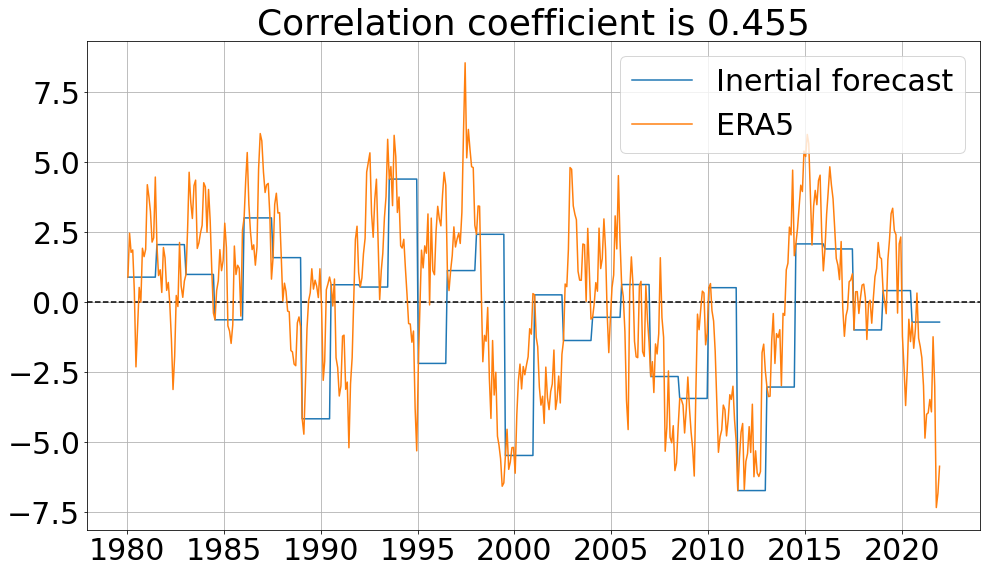

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


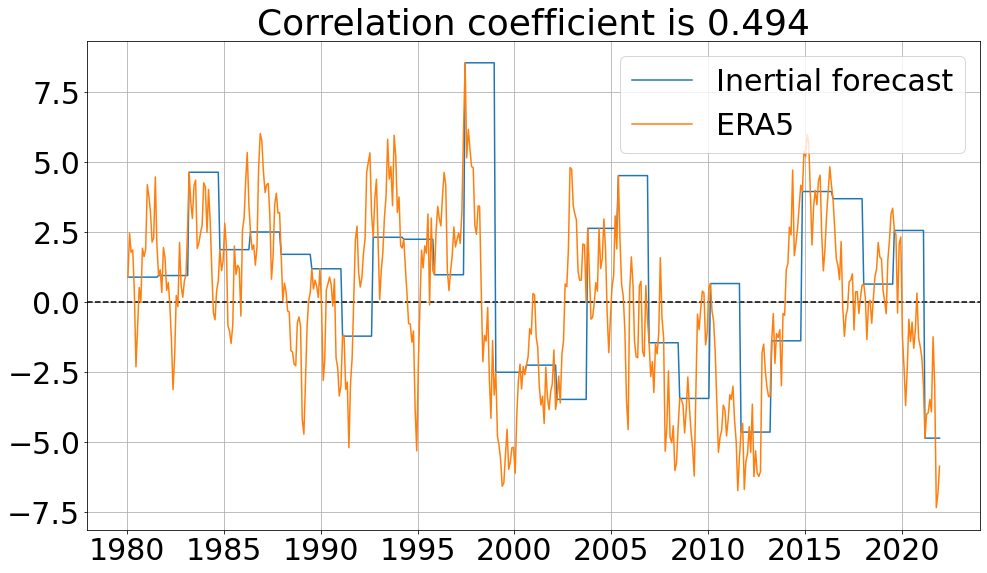

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


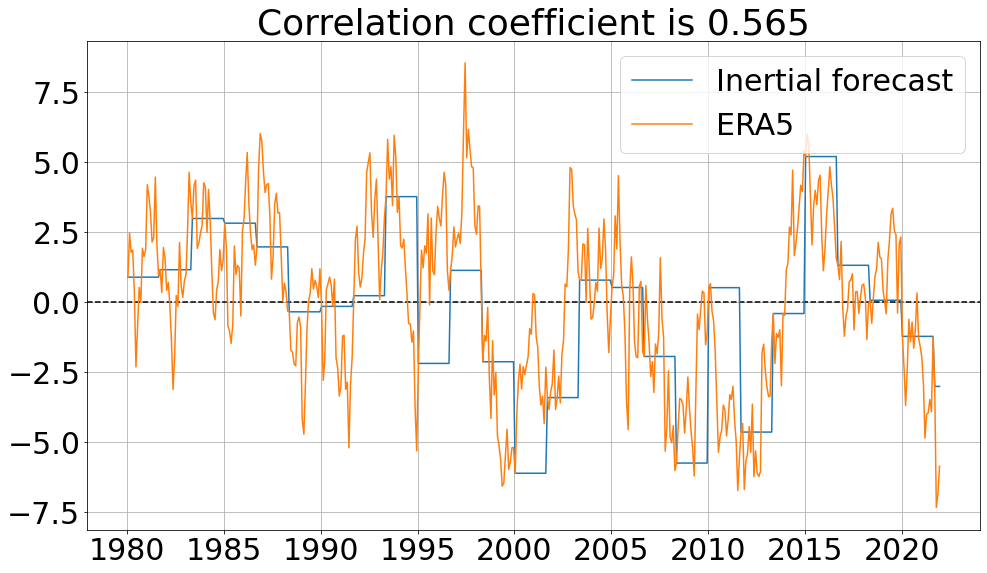

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


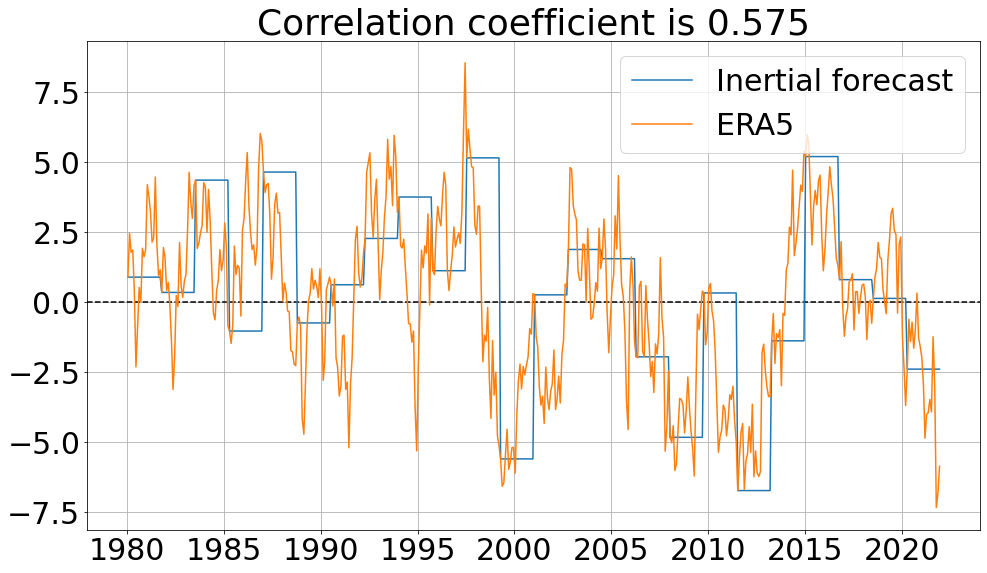

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


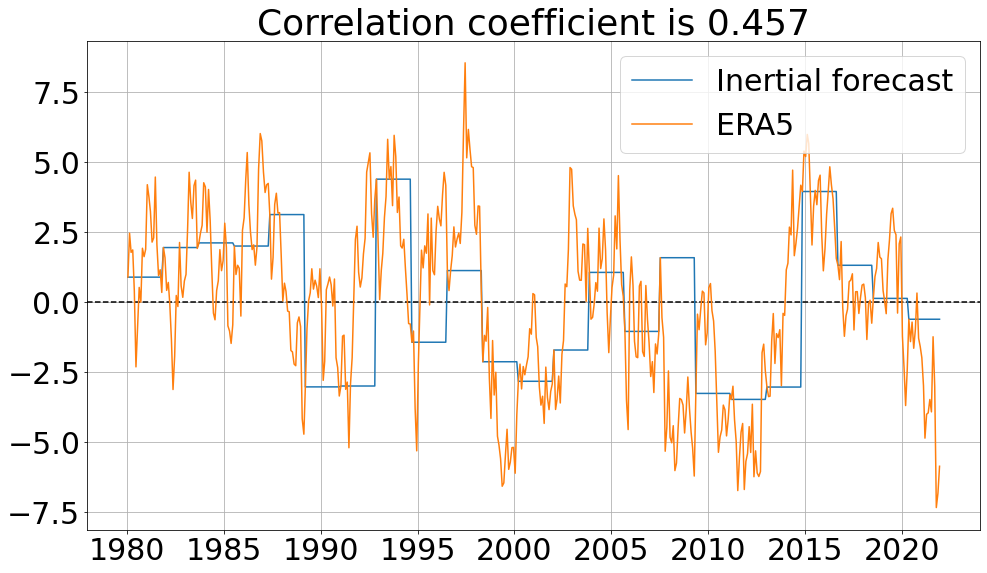

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


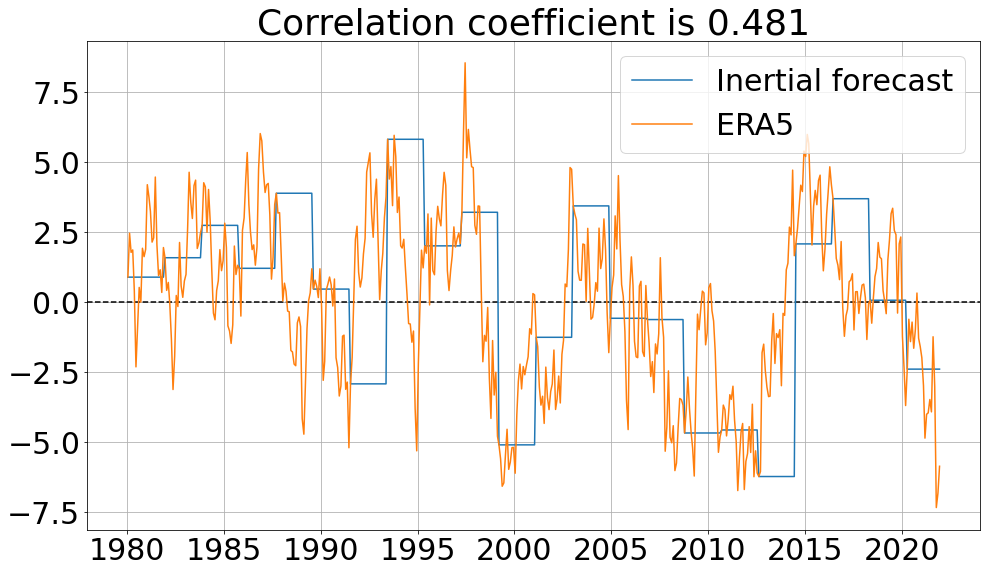

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


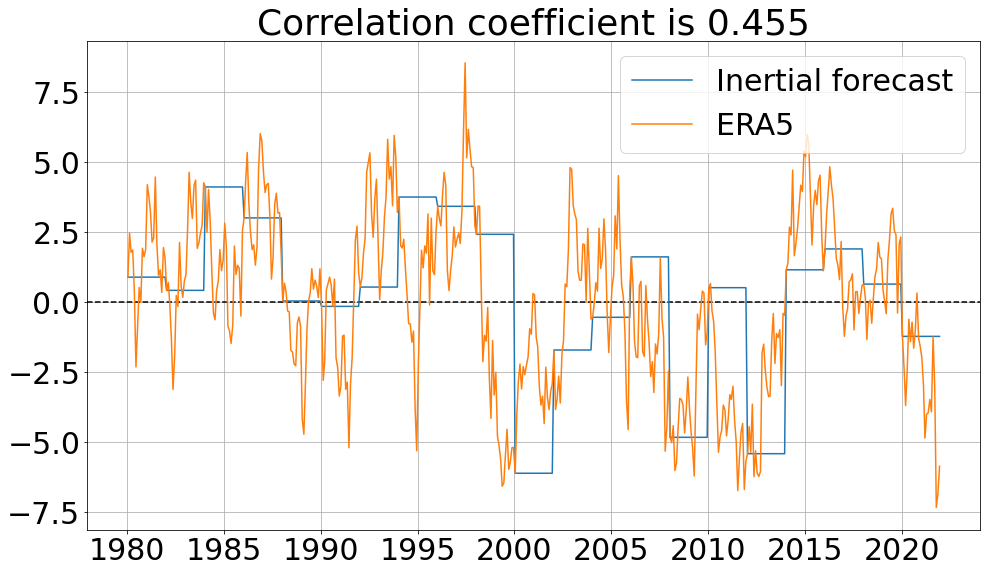

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


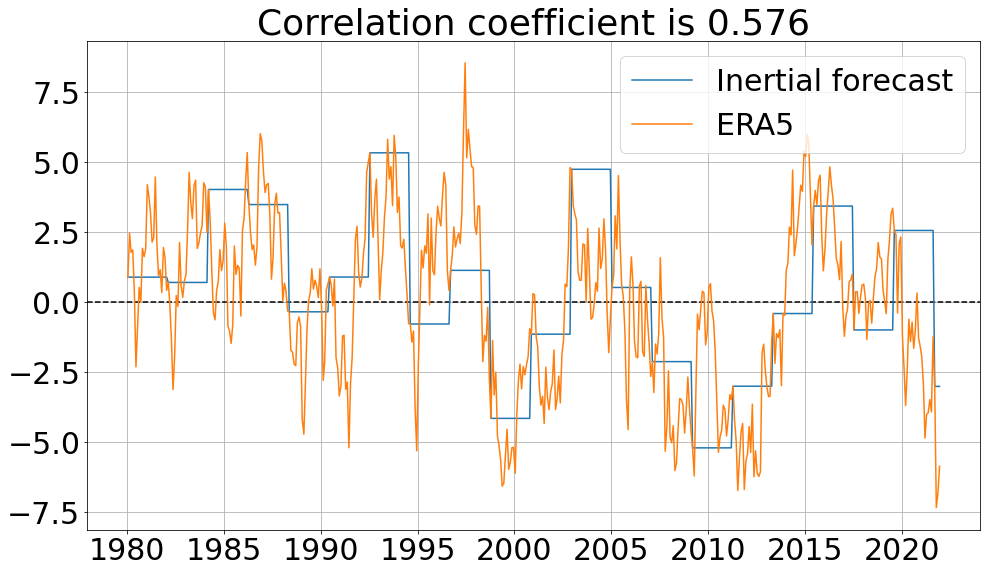

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


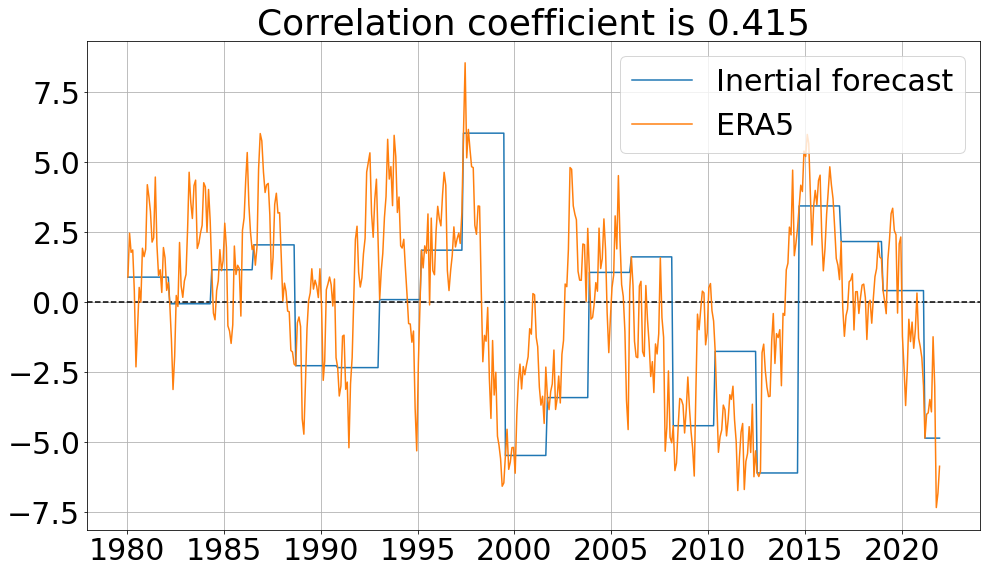

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


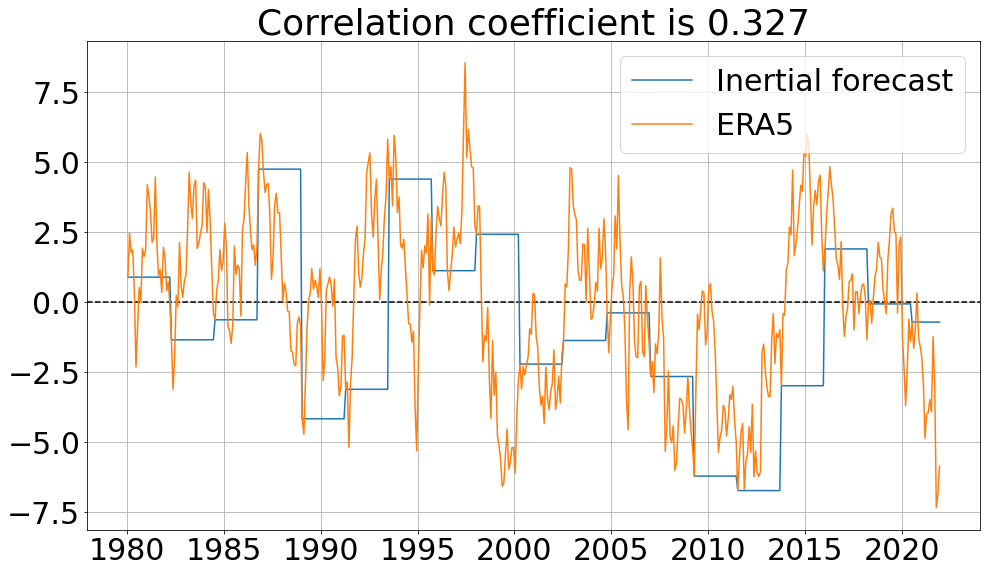

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


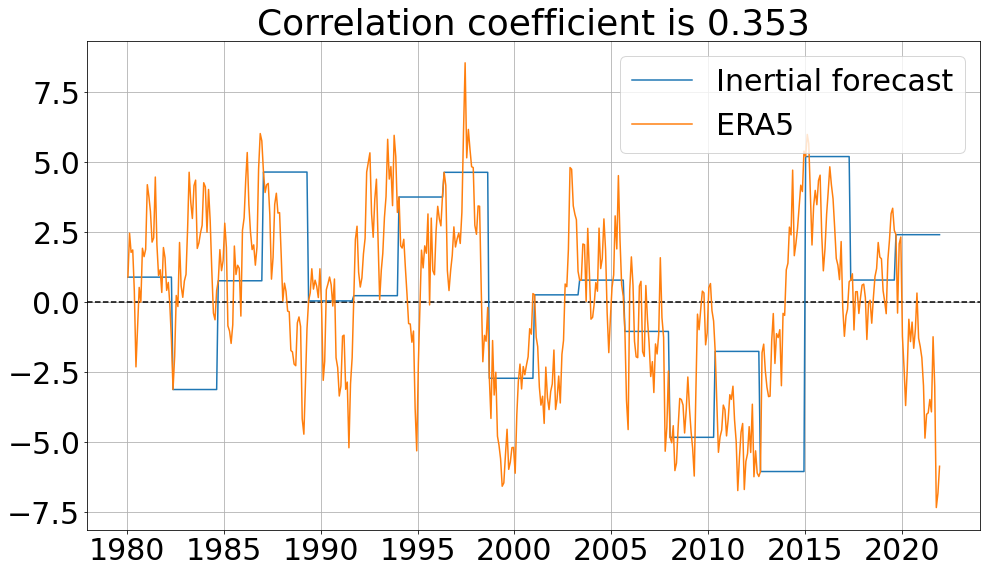

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


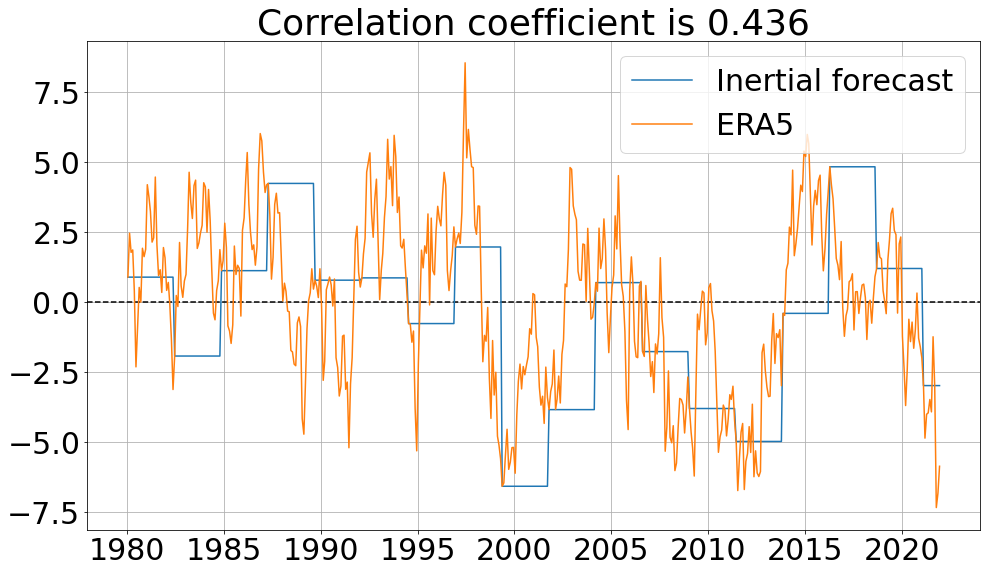

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


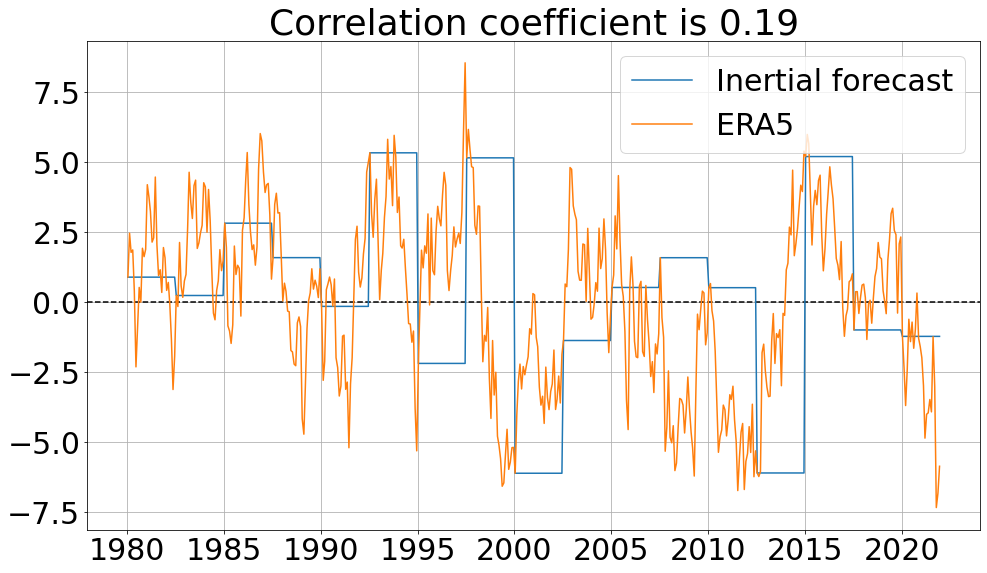

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


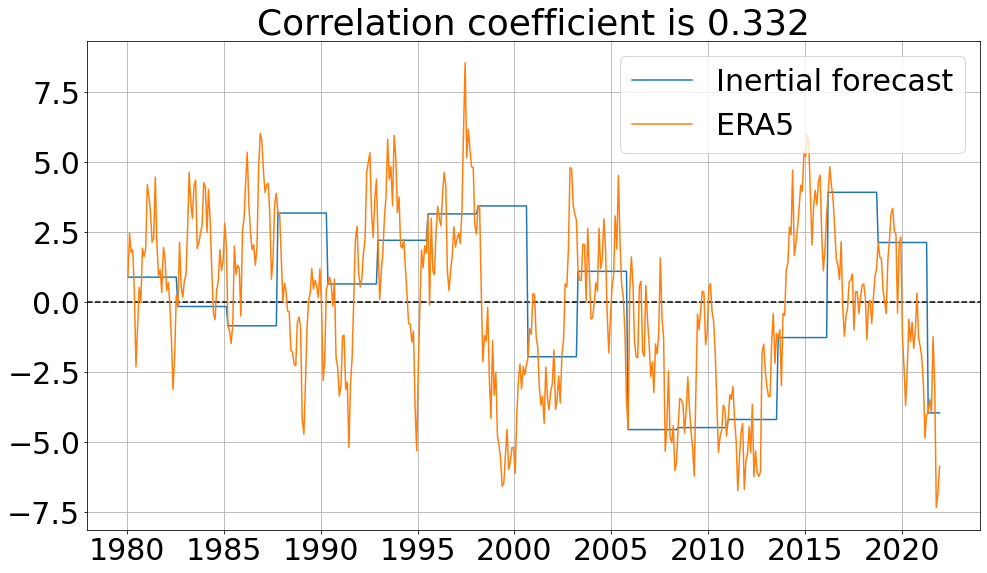

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


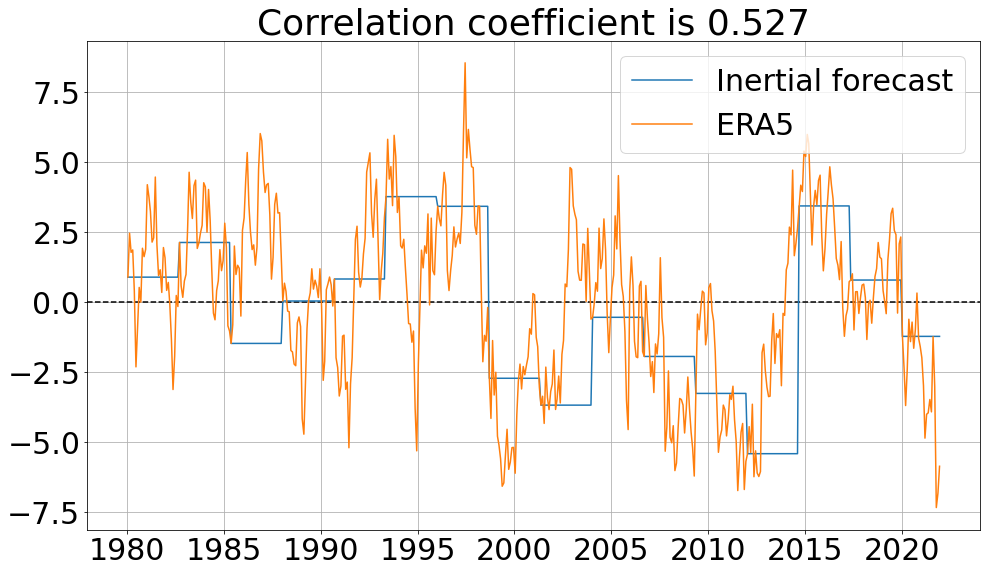

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


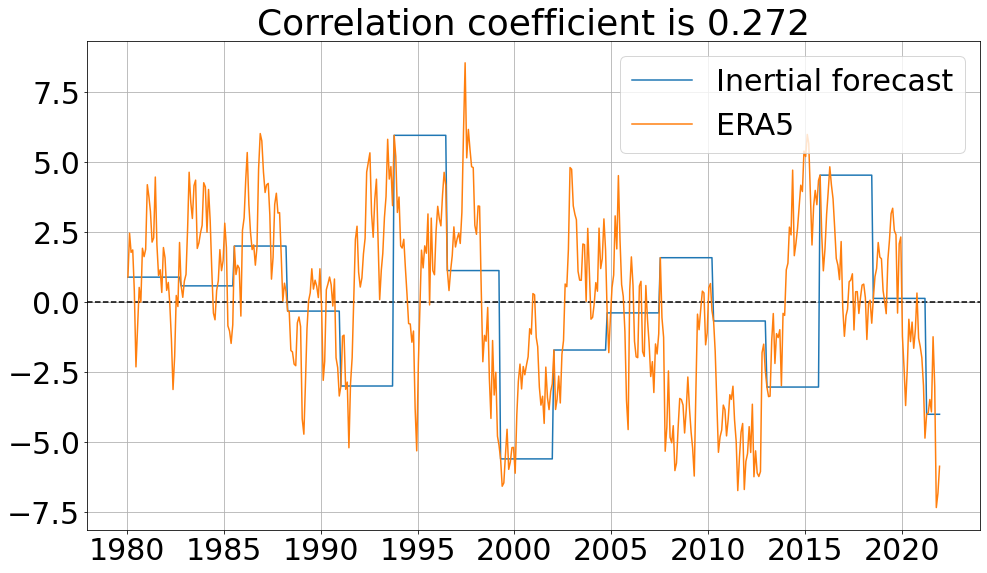

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


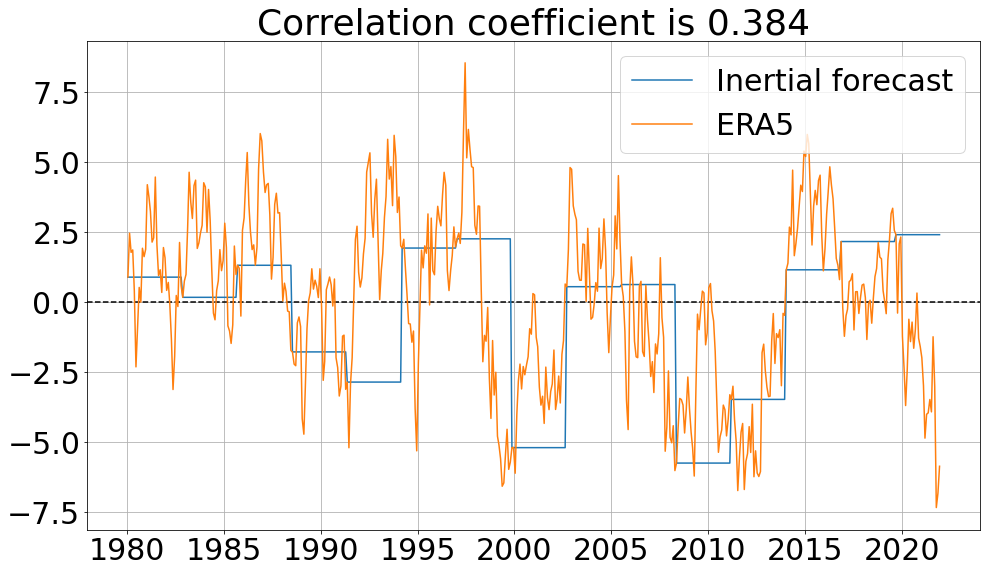

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


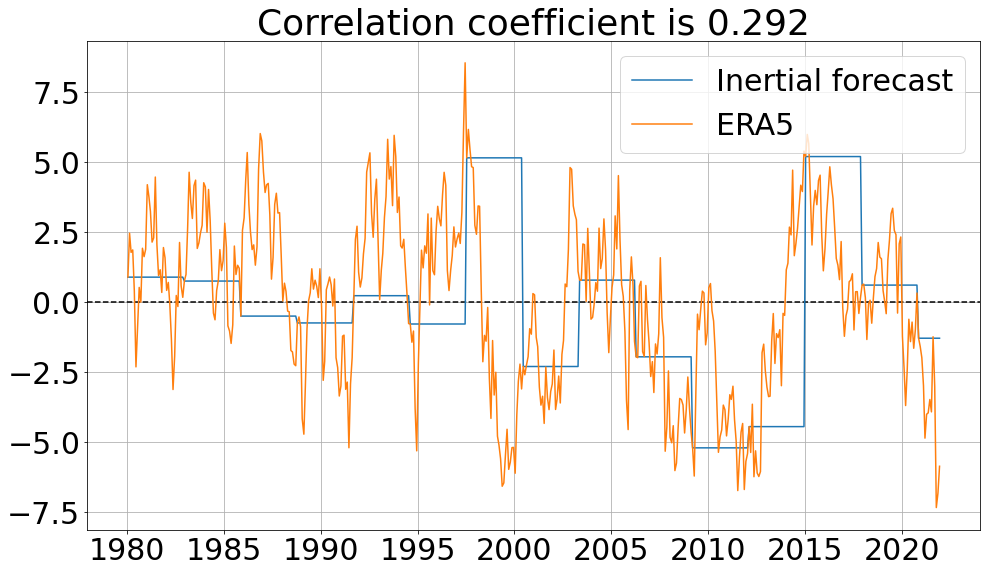

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


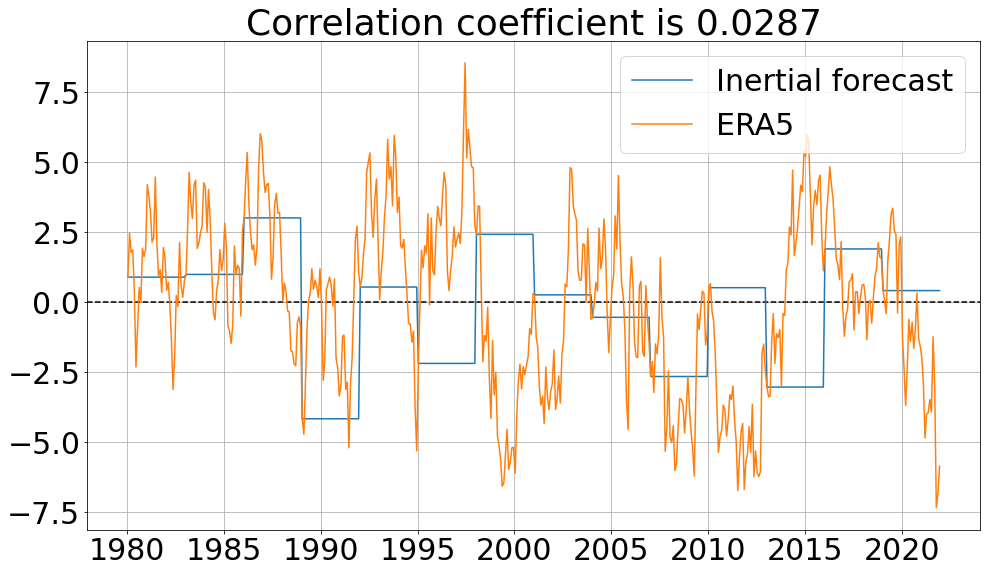

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


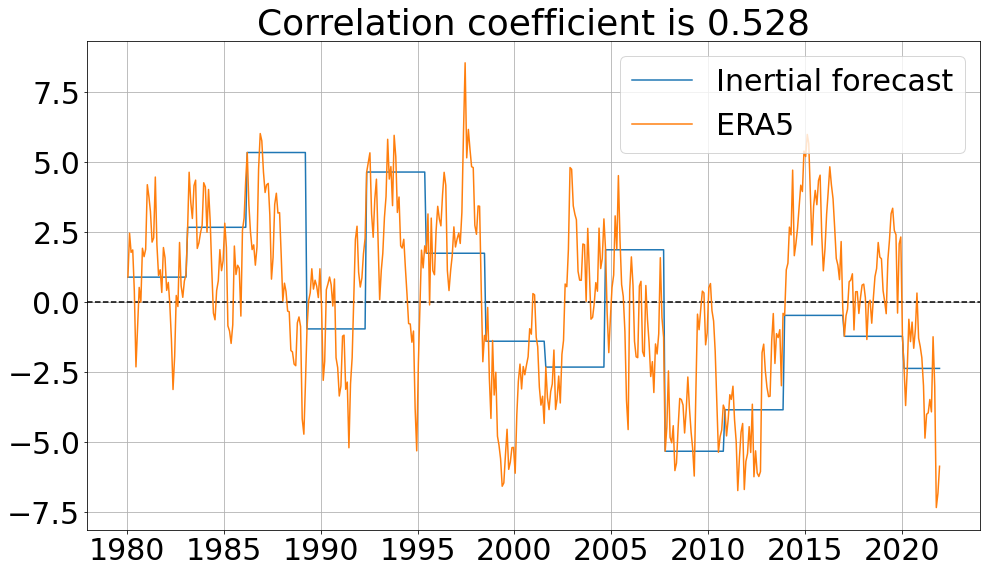

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


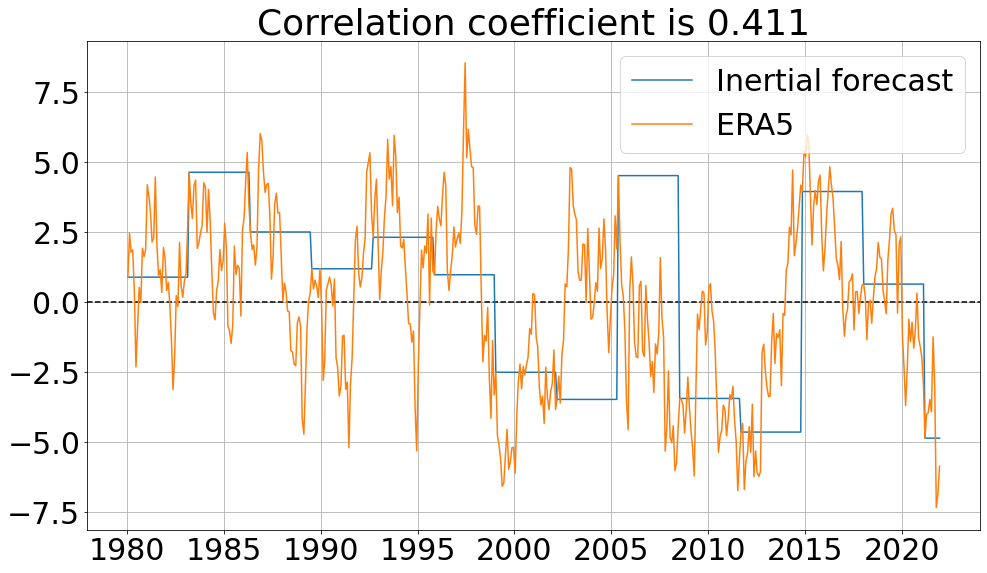

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


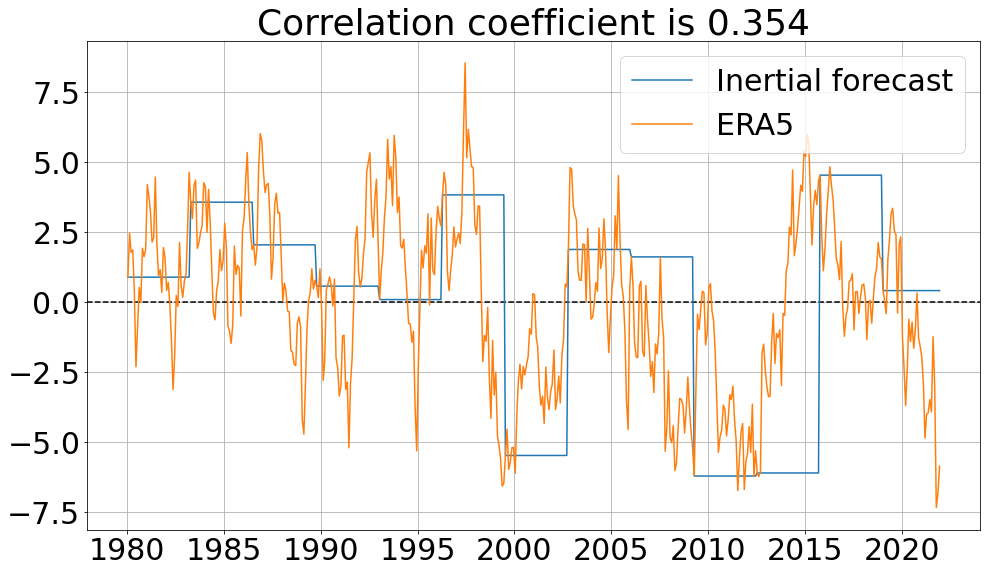

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


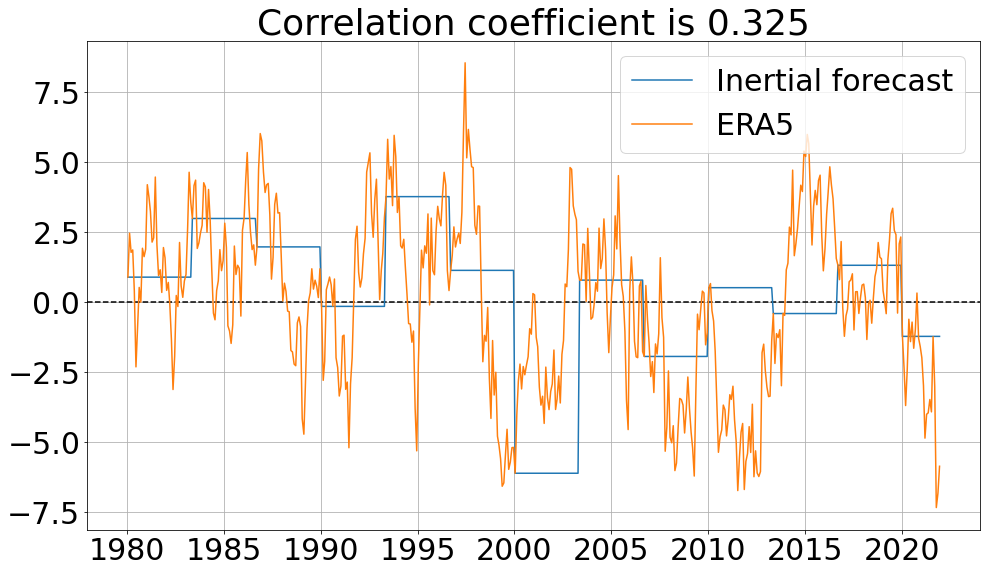

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


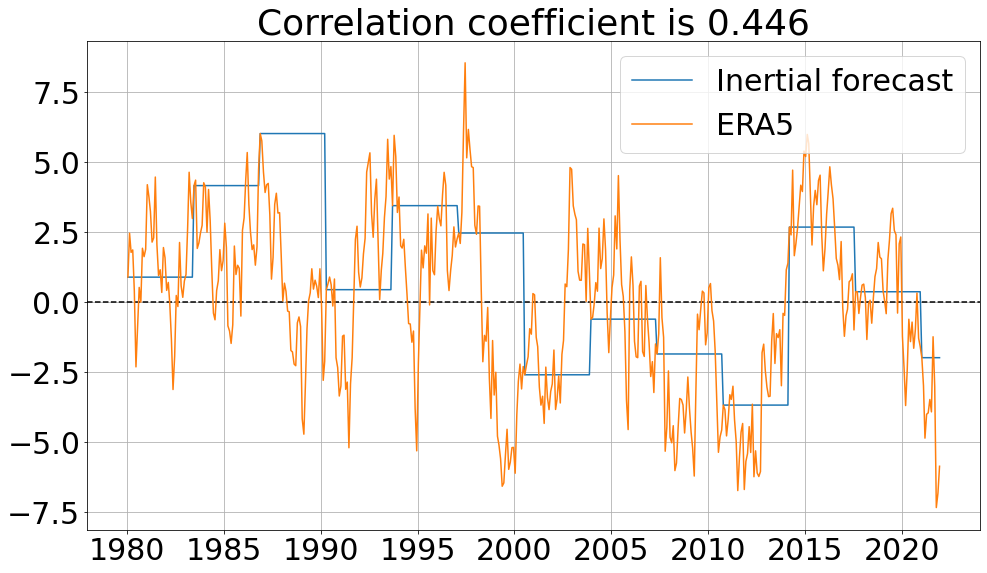

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


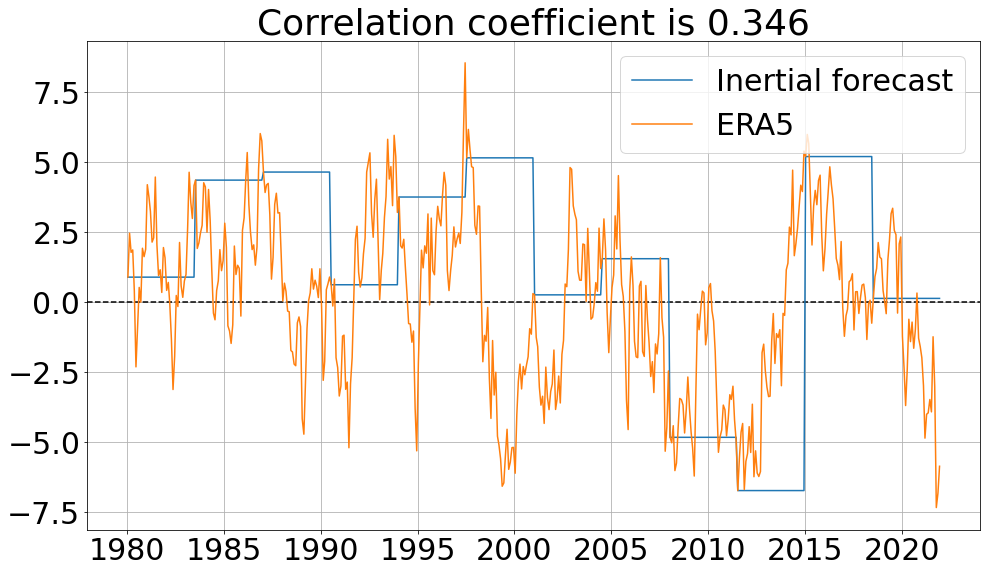

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


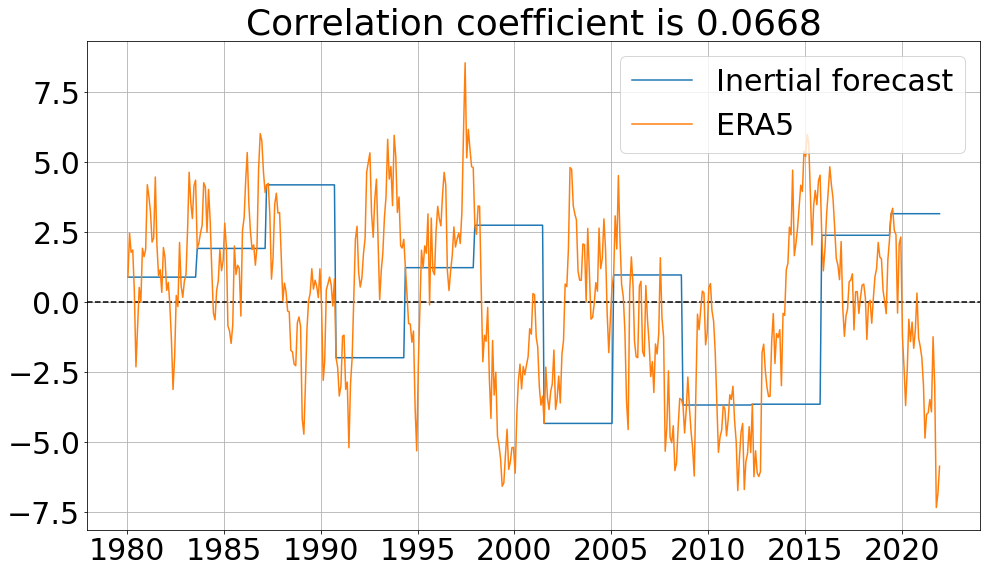

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


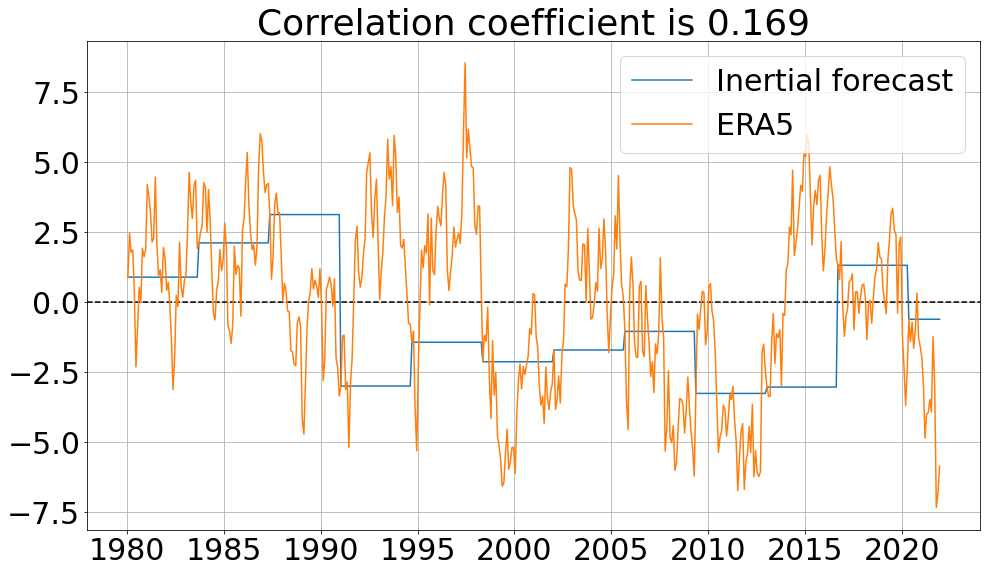

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


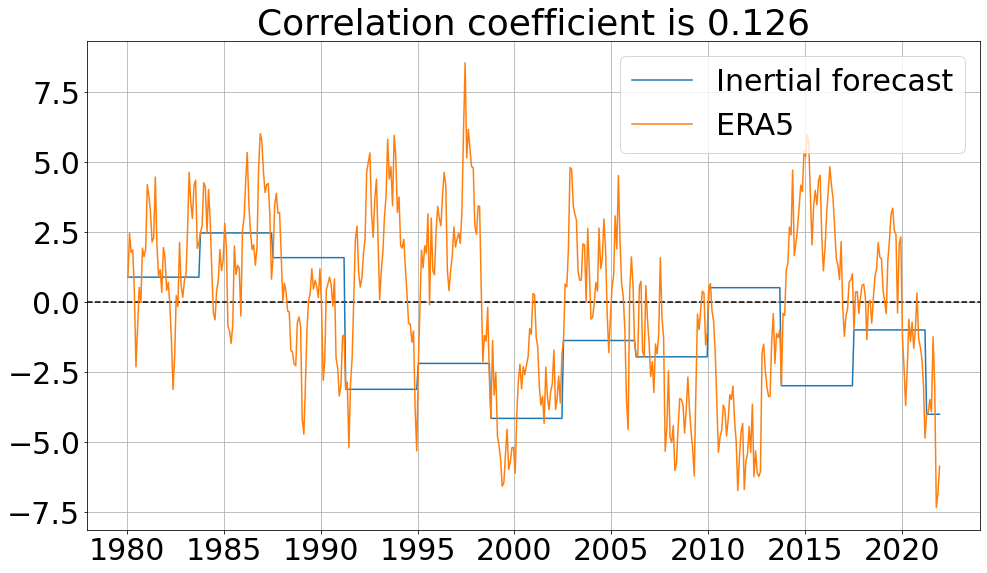

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


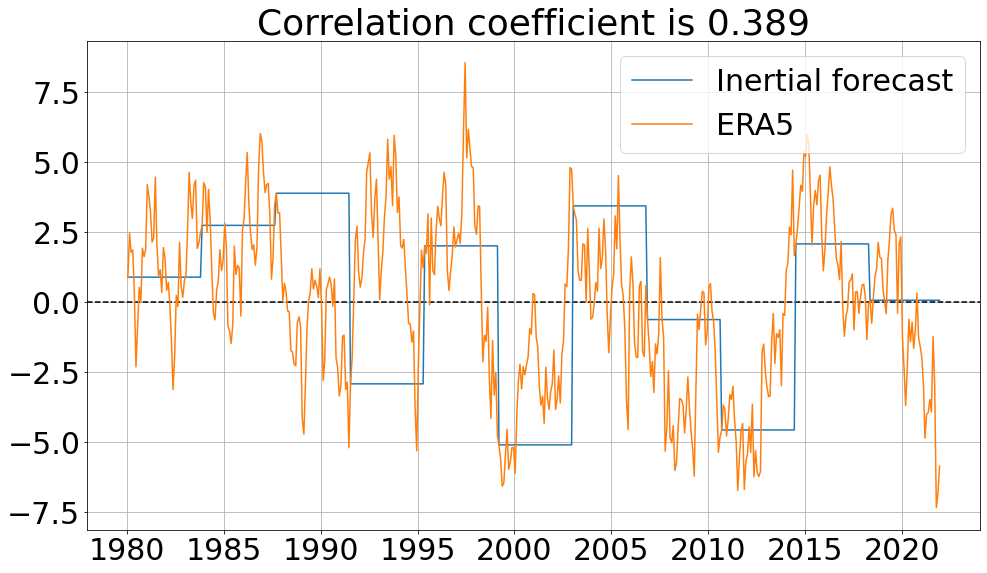

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


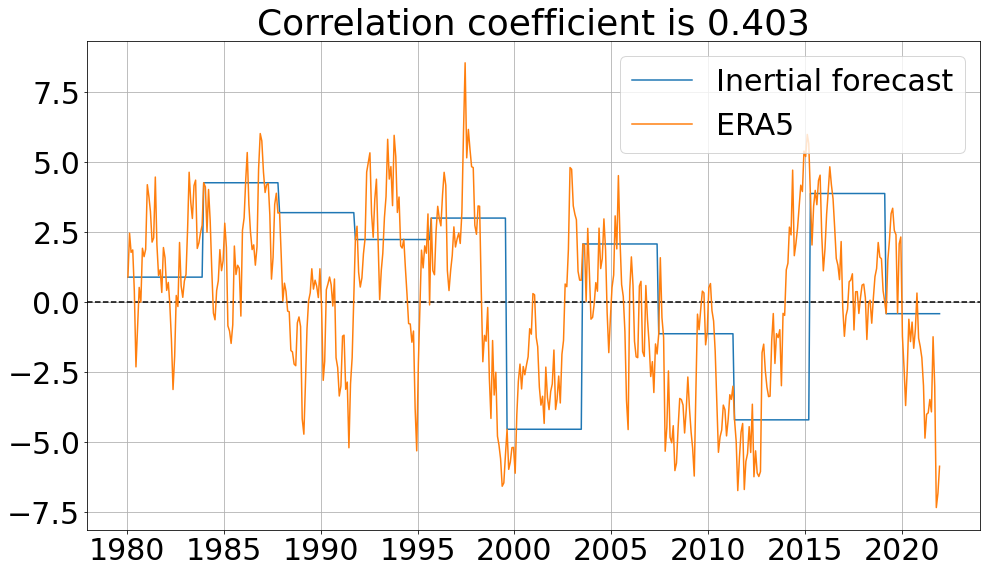

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


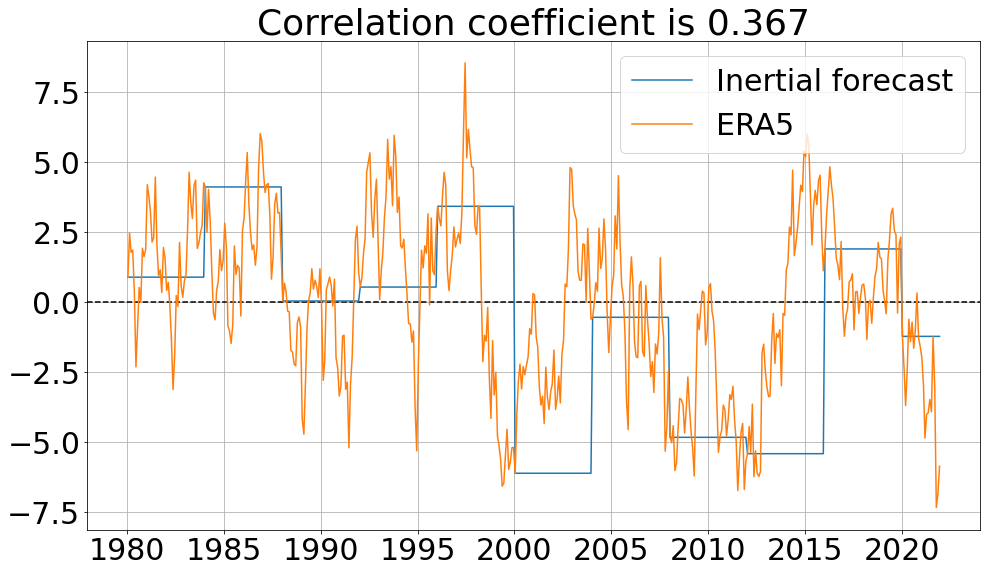

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


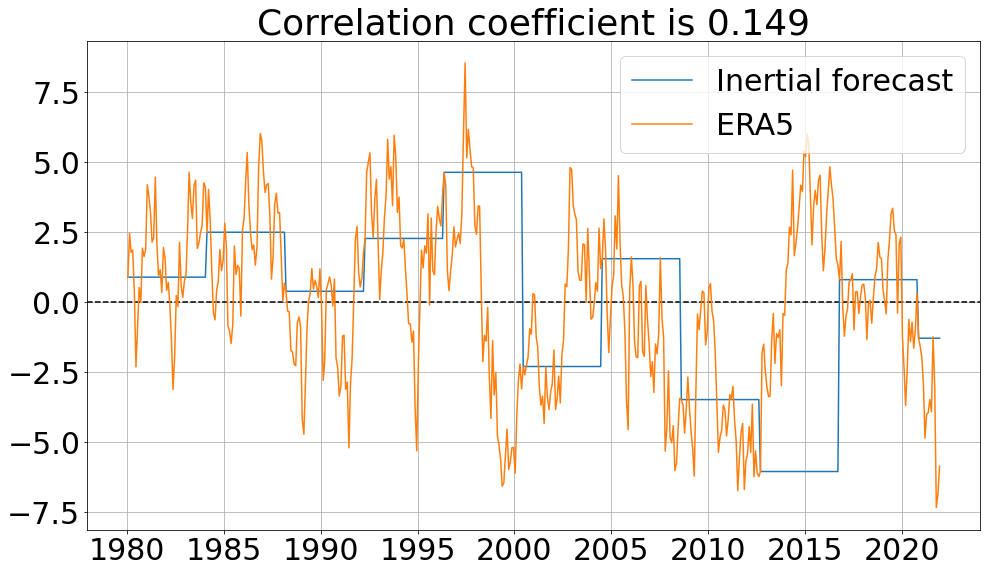

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


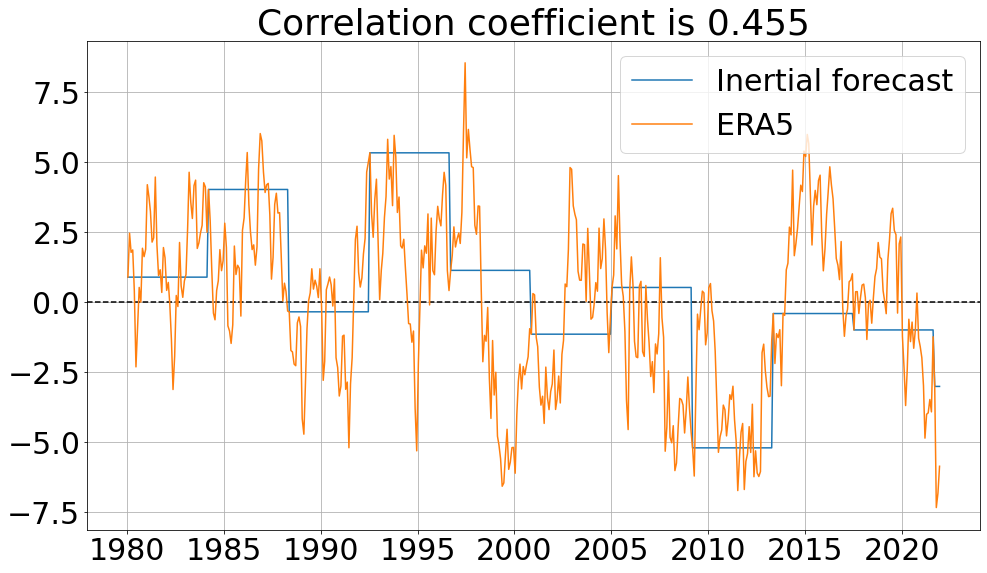

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


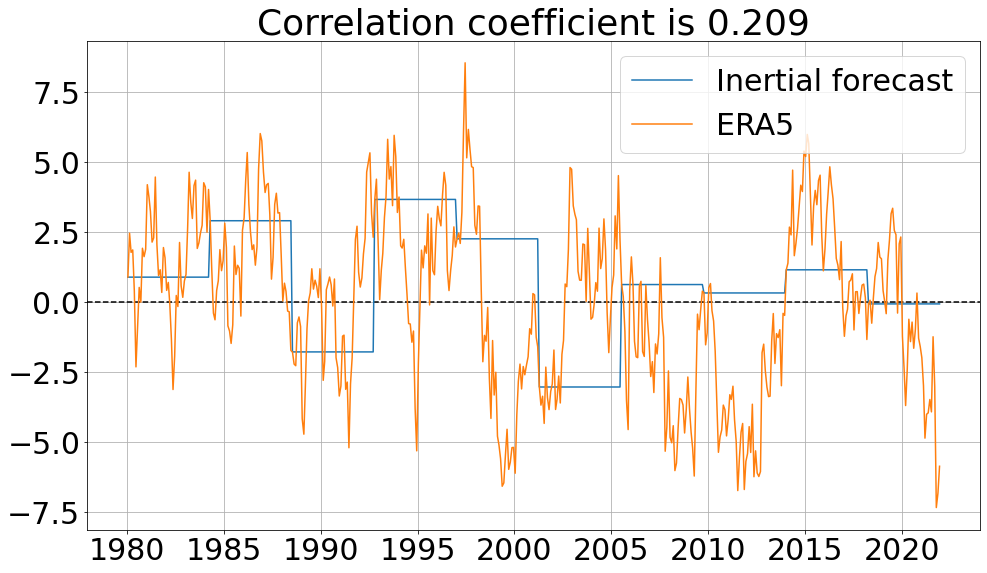

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


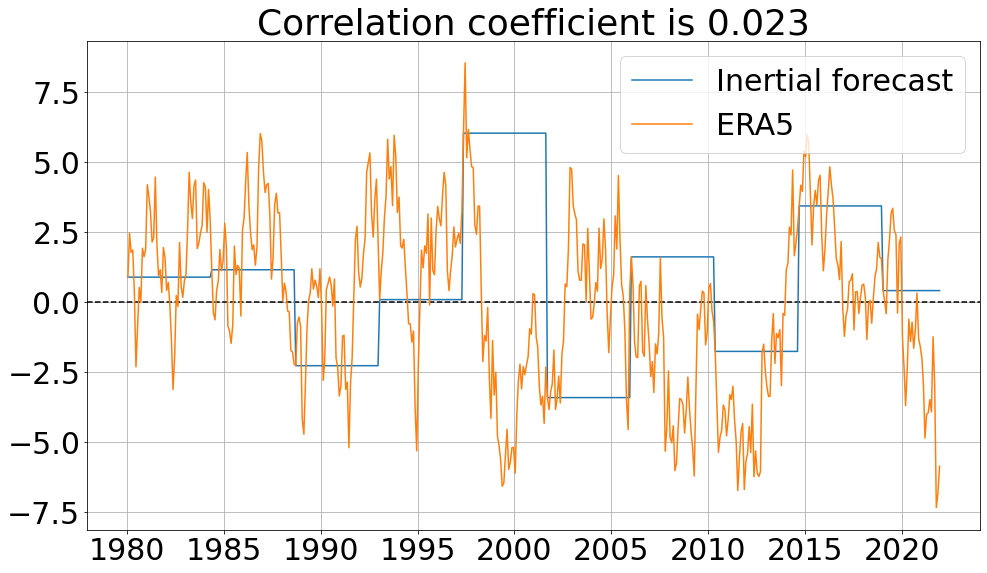

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


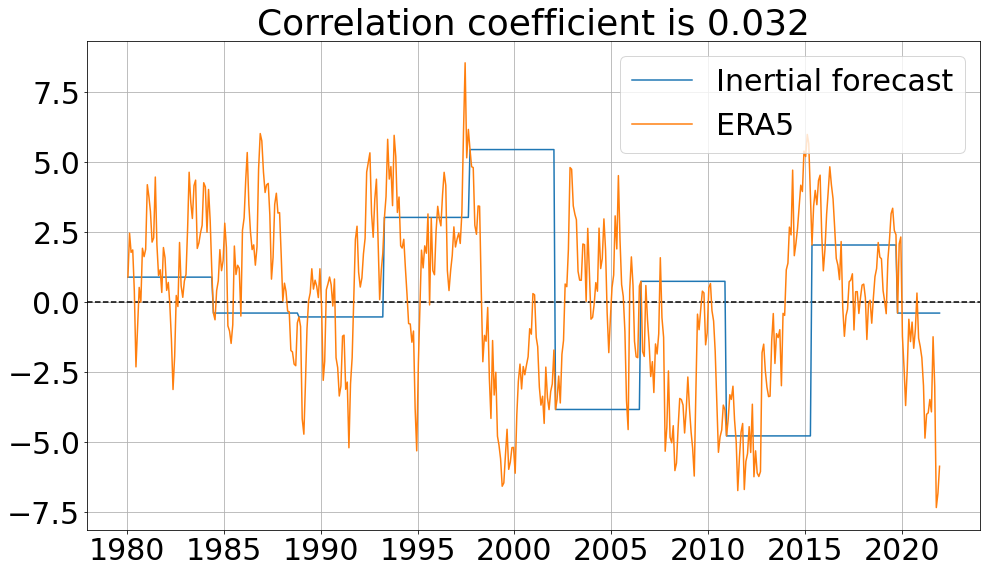

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


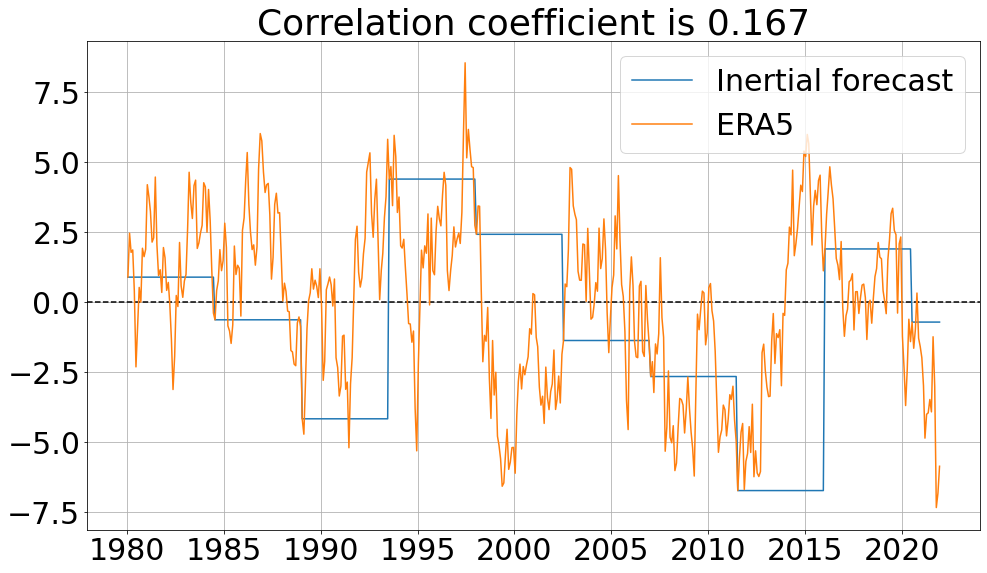

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


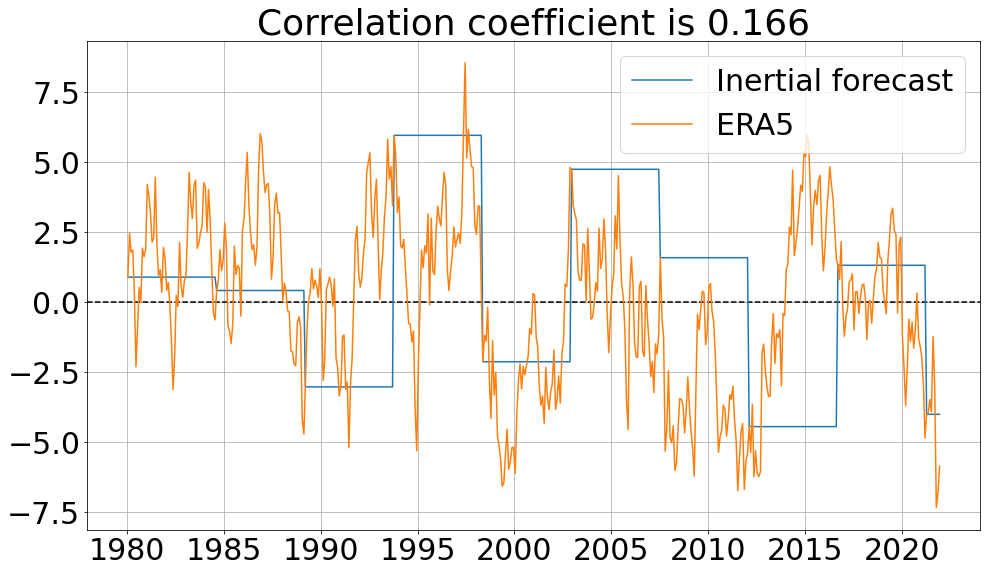

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


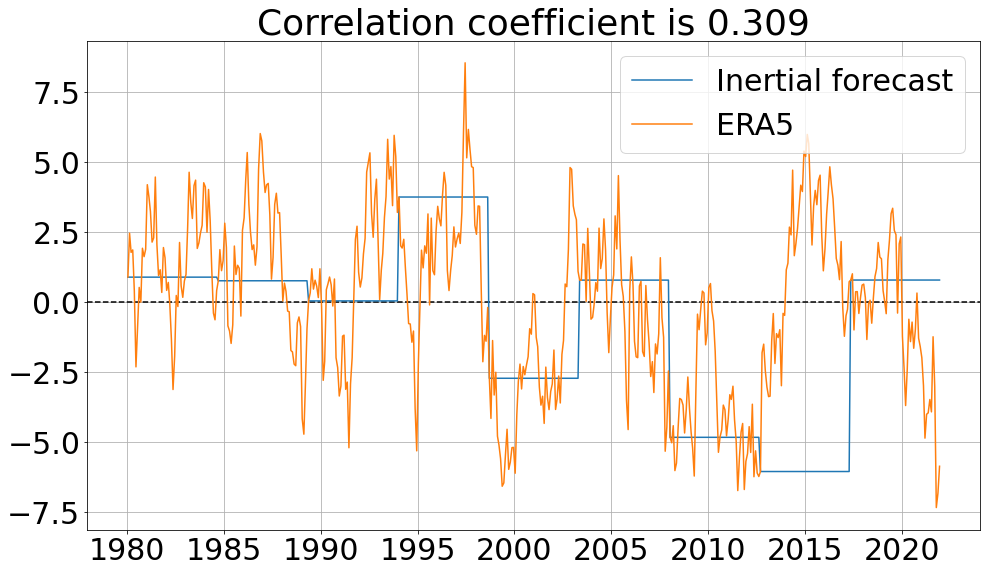

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


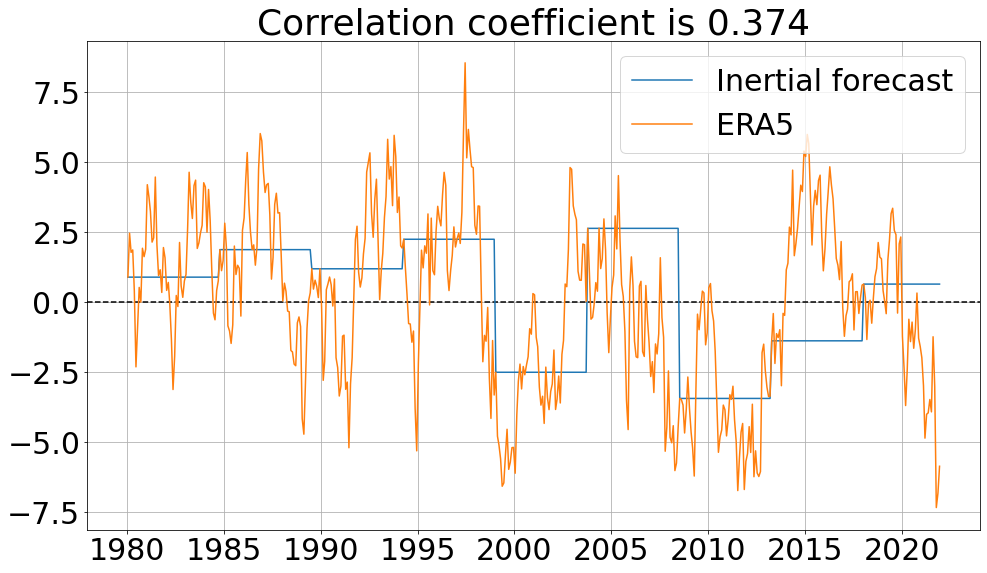

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


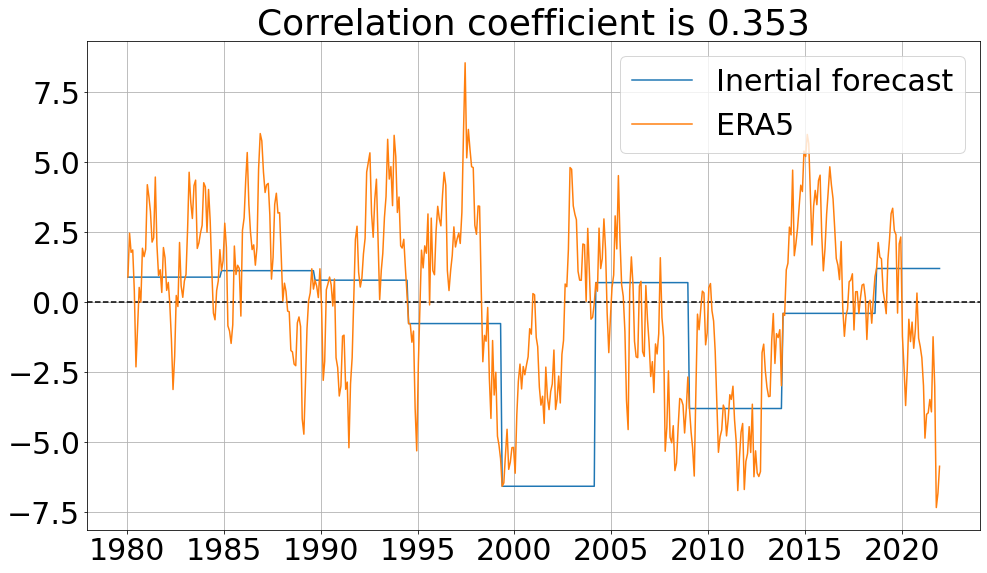

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


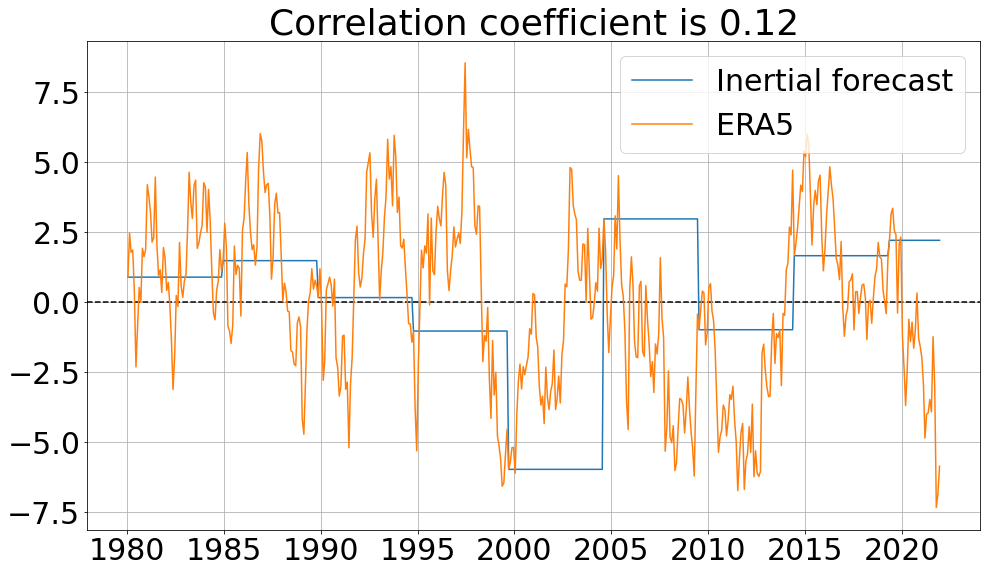

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


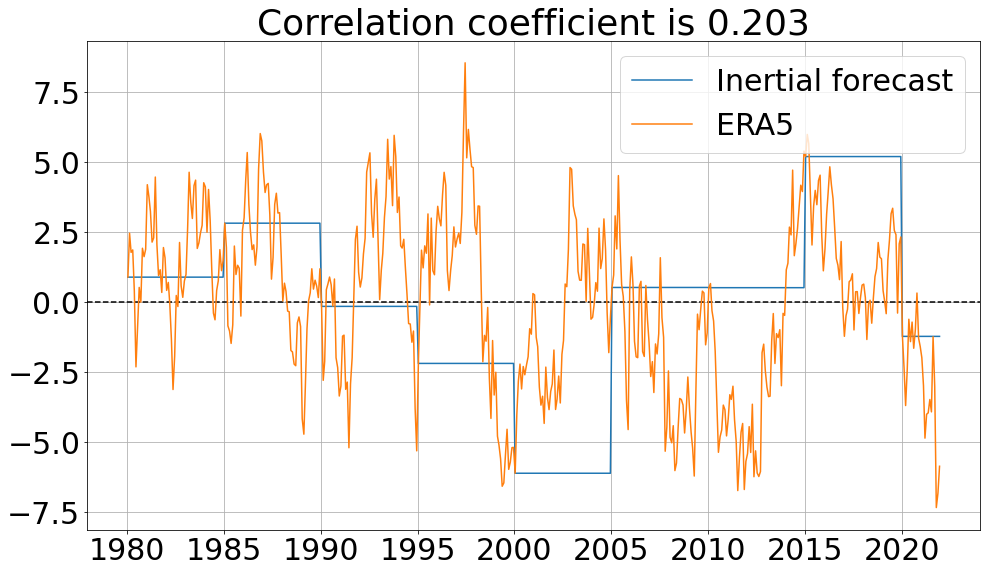

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


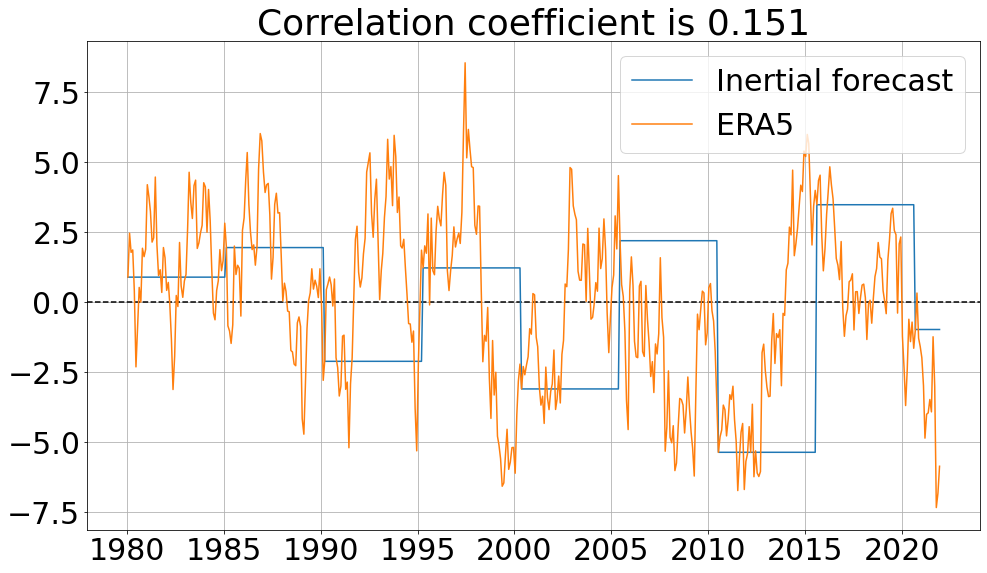

In [59]:
corrs = []
for i in range(1, 61):
    corrs.append(plot_inertial_forecast(i))

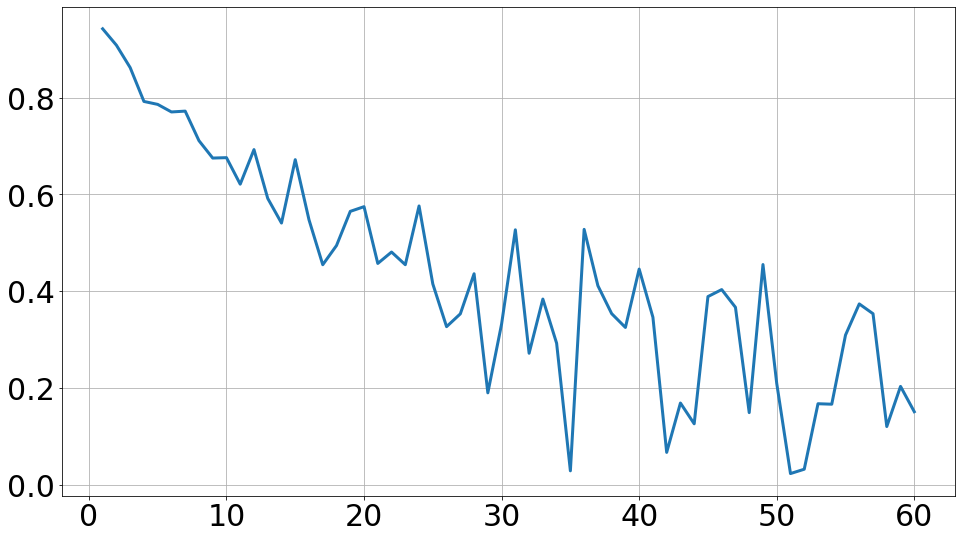

In [66]:
plt.figure(figsize=(16,9))
plt.plot(range(1, 61), corrs, linewidth=3)
#plt.title('Зависимость коэффициента корреляции от числа месяцев в инерционном прогнозе')
#plt.xlabel('Число месяцев')
#plt.ylabel('Months amount')
plt.grid()
plt.savefig(f'contents/pdo_inertial_forecast/corrcoeffs.eps', bbox_inches='tight')
plt.show()

## Потенциальная предсказуемость индекса PDO с помощью использованной модели климата.

Вместо ERA5 используем одну из моделей

In [67]:
def get_model_data(n):
    model = []
    for i in range(42):
        year = i + 1980
        curr_data = np.fromfile('data/HINDCASTS/TS' + str(year) + '.STD', dtype=np.float32).reshape(62, 10, 120, 180)
        model.append(curr_data[2 : , n, :, :])
    model = np.array(model).astype('float64')
    return model 

In [68]:
def get_other_models_data(n):
    model = []
    inds = np.append(np.arange(0, n), np.arange(n + 1, 10))
    for i in range(42):
        year = i + 1980
        curr_data = np.fromfile('data/HINDCASTS/TS' + str(year) + '.STD', dtype=np.float32).reshape(62, 10, 120, 180)
        model.append(curr_data[2 : , inds, :].mean(axis=1))
    model = np.array(model).astype('float64')
    return model

In [69]:
def get_certain_years(model, year):
    return model[:, year * 12 : (year + 1) * 12, :, :]

In [70]:
def get_corr_coeffs(model_num, year=0):
    model = get_model_data(model_num)
    model = get_certain_years(model, year)
    ocean = prepare_data(model, 'ERA5')
    #eofs, ocean = calc_eofs(model, mode='ERA5')
    '''
    plt.matshow(eofs.reshape(32, 65), origin='lower', cmap='RdBu')
    plt.colorbar()
    plt.title(f'Первые ЕОФы модели {model_num}')
    plt.savefig(f'./models_info/eof{model_num}.pdf')
    '''
    pdo = calculate_pdo(ocean.reshape(504, 32, 65), eofs)

    print(f'Model {model_num}: min = {pdo.min():.3}, max = {pdo.max():.3}')

    other = get_other_models_data(model_num)
    other = other[:, : 12, :, :]
    other = prepare_data(other, mode='ERA5')

    pdo_other = calculate_pdo(other.reshape(504, 32, 65), eofs)

    print(f'Others for model {model_num}: min = {pdo_other.min():.3}, max = {pdo_other.max():.3}')

    corr_all = np.corrcoef(pdo, pdo_other)[0, 1]

    # dates
    start_date = datetime(1981, 1, 1)
    end_date = datetime(2022, 12, 1)
    dates = []
    for dt in rrule.rrule(rrule.MONTHLY, dtstart=start_date, until=end_date):
        dates.append(dt)
    dates = np.array(dates)
    plt.figure(figsize=(16,9))
    plt.axhline(0, color='black', linestyle='--')
    plt.plot(dates, pdo, label=f'PDO члена ансамбля номер {model_num}')
    plt.plot(dates, pdo_other, label='PDO остальных членов ансамбля')
    plt.title(f'Потенциальный прогноз индекса PDO для члена ансамбля номер {model_num}\n Коэффициент корреляции равен {corr_all:.3}')
    #plt.xticks(dates[::12], rotation=45)
    plt.legend()
    plt.savefig(f'contents/models_info/pdo{model_num}.eps')
    plt.show()

    corrs = []

    for i in range(12):
        pdo_month = pdo[i : : 12]
        pdo_other_month = pdo_other[i : : 12]
        corrs.append(np.corrcoef(pdo_month, pdo_other_month)[0, 1])

    return corr_all, corrs



Model 0: min = -8.02, max = 8.36


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Others for model 0: min = -5.86, max = 6.11


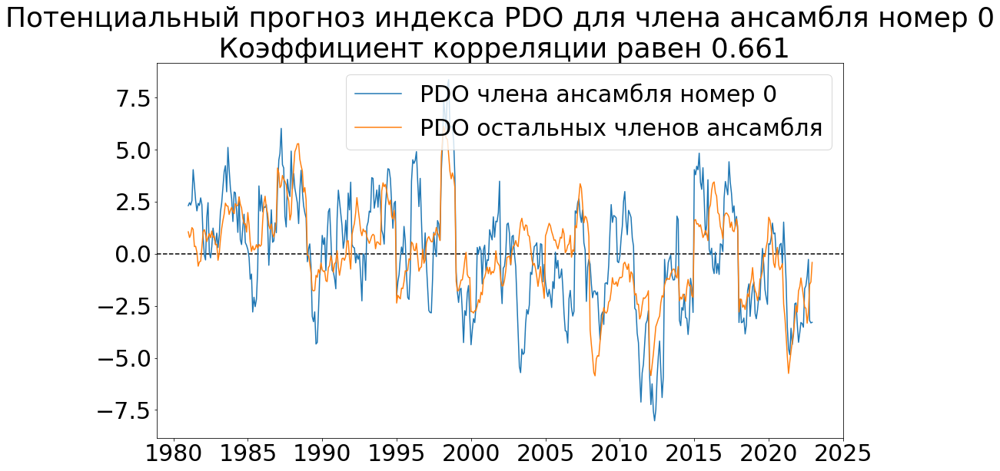

Model 1: min = -8.83, max = 10.7


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Others for model 1: min = -5.9, max = 5.68


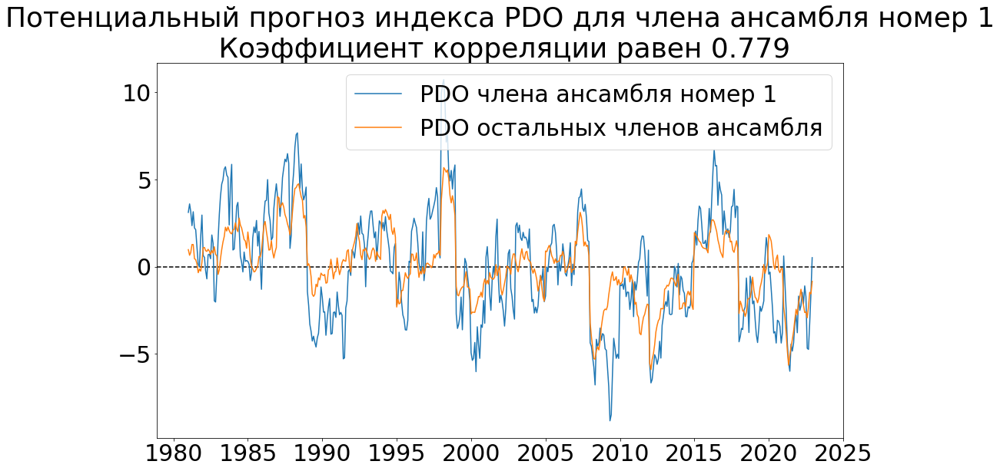

Model 2: min = -6.6, max = 9.63


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Others for model 2: min = -6.01, max = 6.05


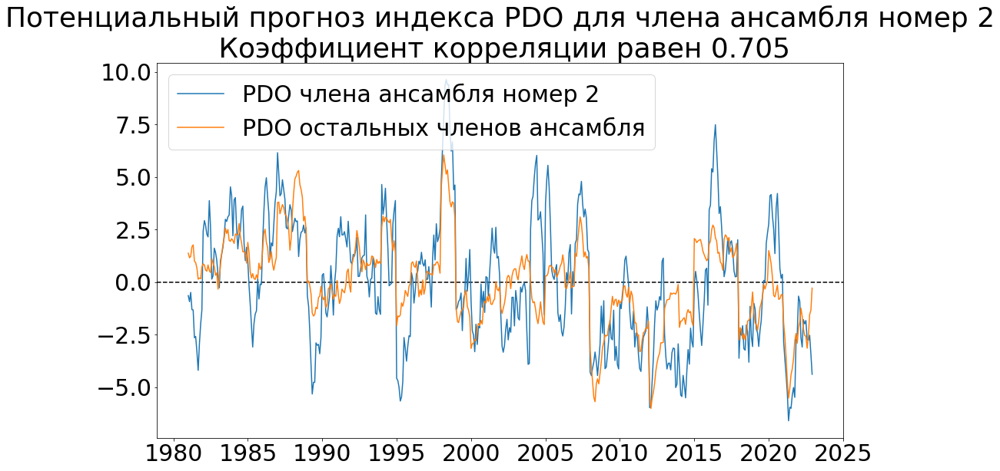

Model 3: min = -8.8, max = 6.32


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Others for model 3: min = -6.13, max = 6.43


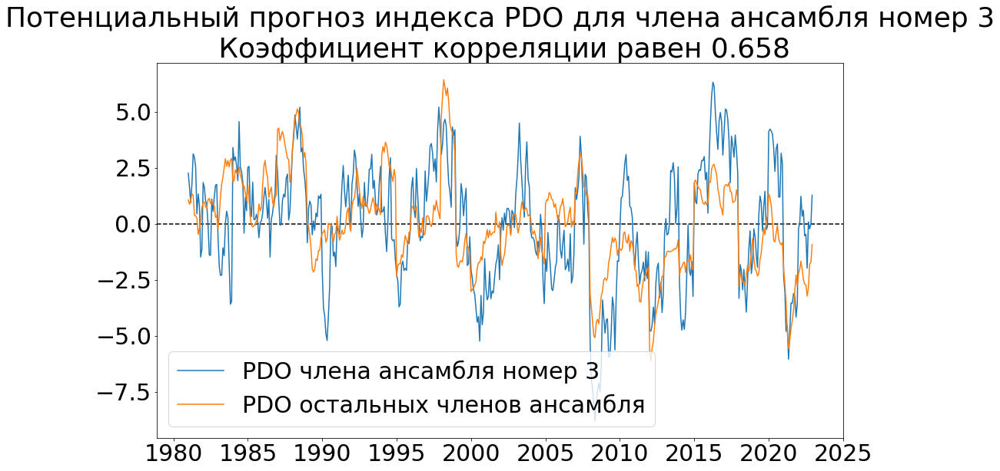

Model 4: min = -8.24, max = 6.06


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Others for model 4: min = -6.26, max = 6.47


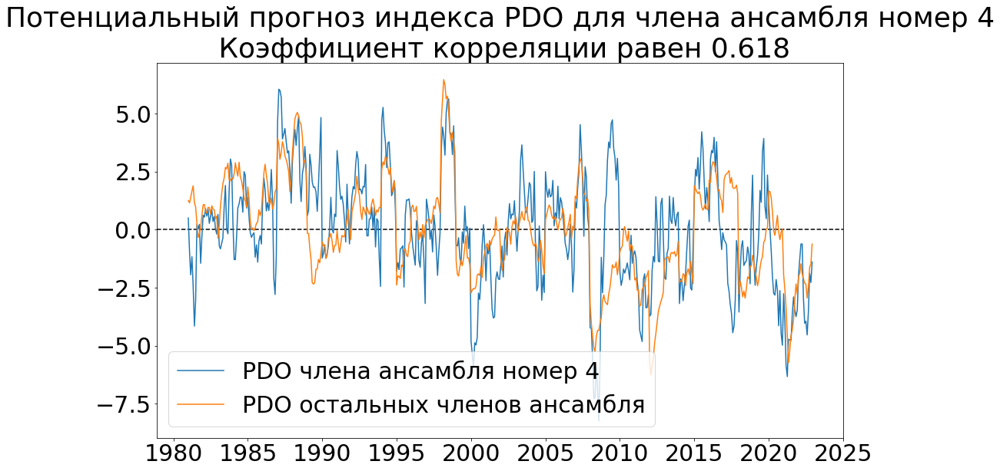

Model 5: min = -8.95, max = 7.12


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Others for model 5: min = -6.12, max = 6.23


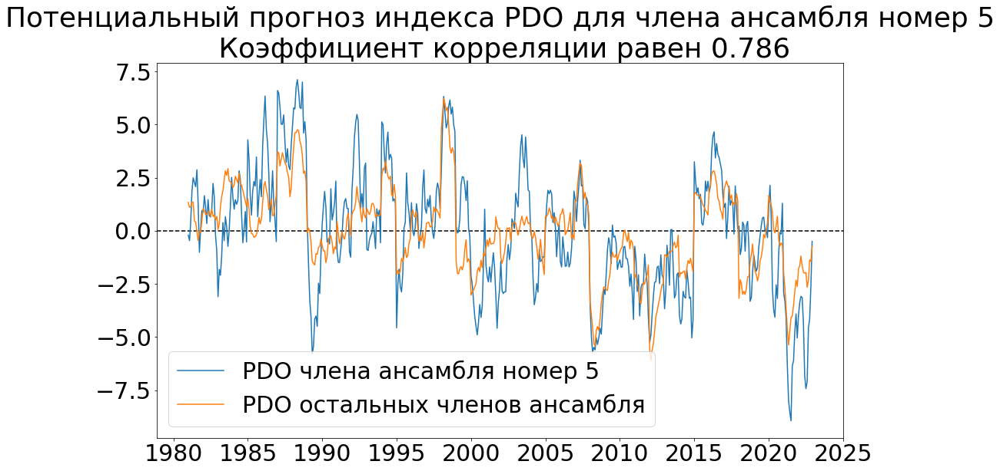

Model 6: min = -9.52, max = 8.51


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Others for model 6: min = -5.93, max = 6.61


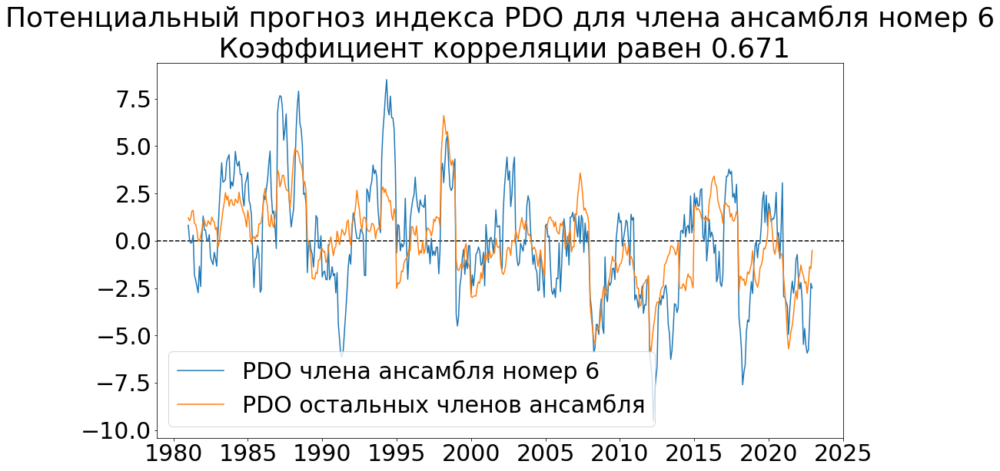

Model 7: min = -6.17, max = 6.98


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Others for model 7: min = -6.03, max = 6.24


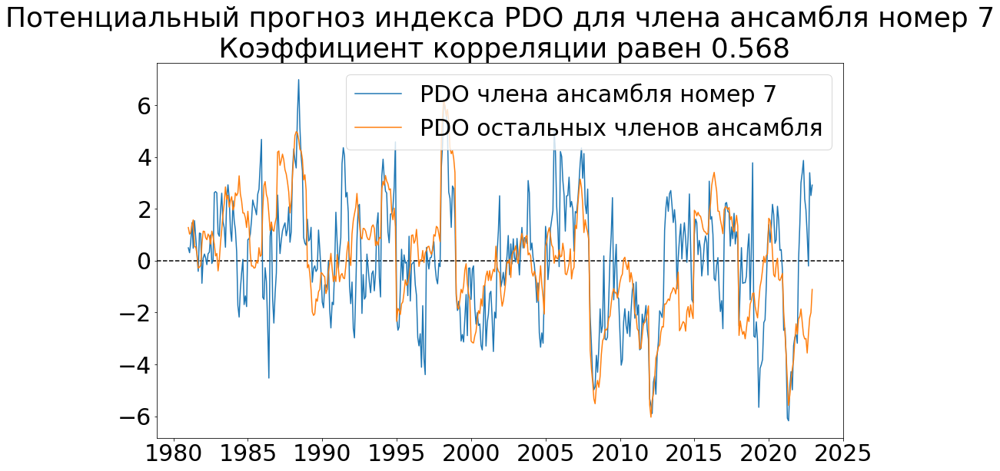

Model 8: min = -8.04, max = 7.35


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Others for model 8: min = -5.88, max = 6.17


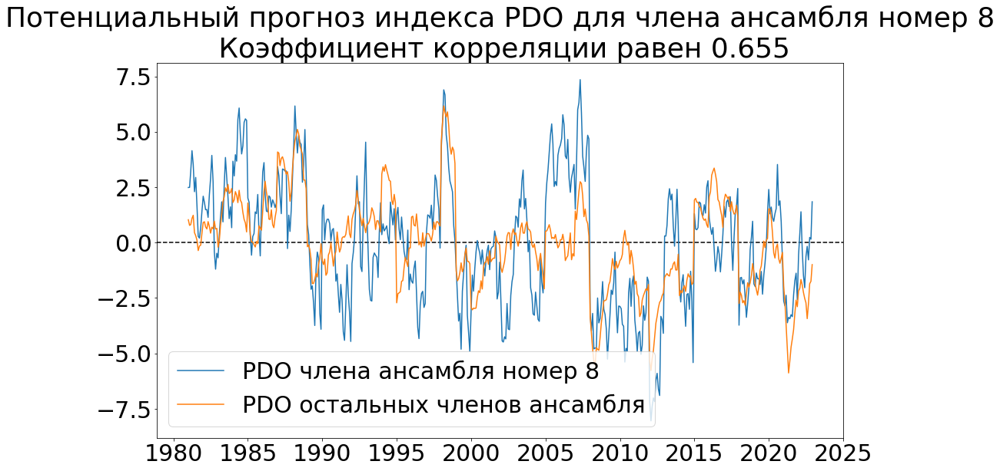

Model 9: min = -6.7, max = 6.05


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Others for model 9: min = -5.92, max = 6.38


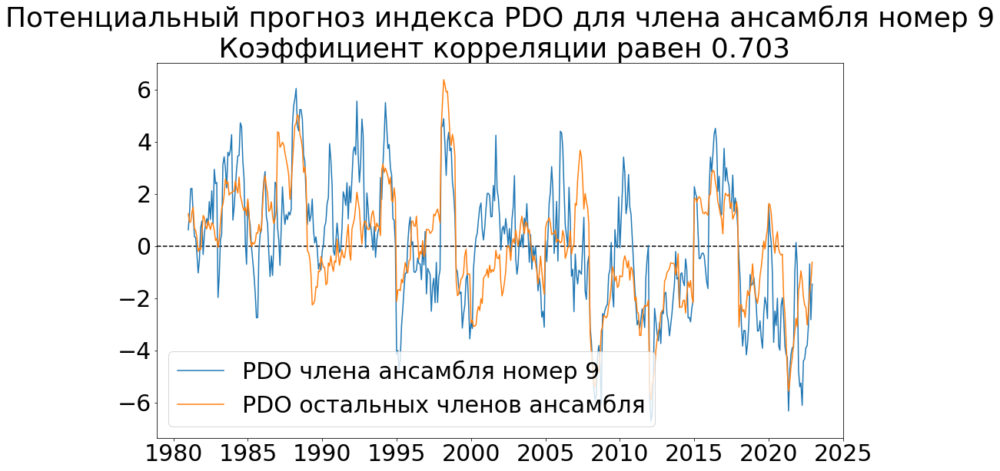

In [71]:
corrs_all = []
coeffs = []
for model_num in range(10):
    res = get_corr_coeffs(model_num)
    corrs_all.append(res[0])
    coeffs.append(res[1])


In [72]:
corrs_all

[0.6612489393811319,
 0.779344225006268,
 0.704527329831819,
 0.6578396066036938,
 0.618129895635432,
 0.7857094582483448,
 0.67136856000984,
 0.56795820292599,
 0.6554608758888237,
 0.7033740581394042]

In [73]:
coeffs = np.array(coeffs)
coeffs.shape

(10, 12)

In [74]:
coeffs_mean = coeffs.mean(axis=0)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


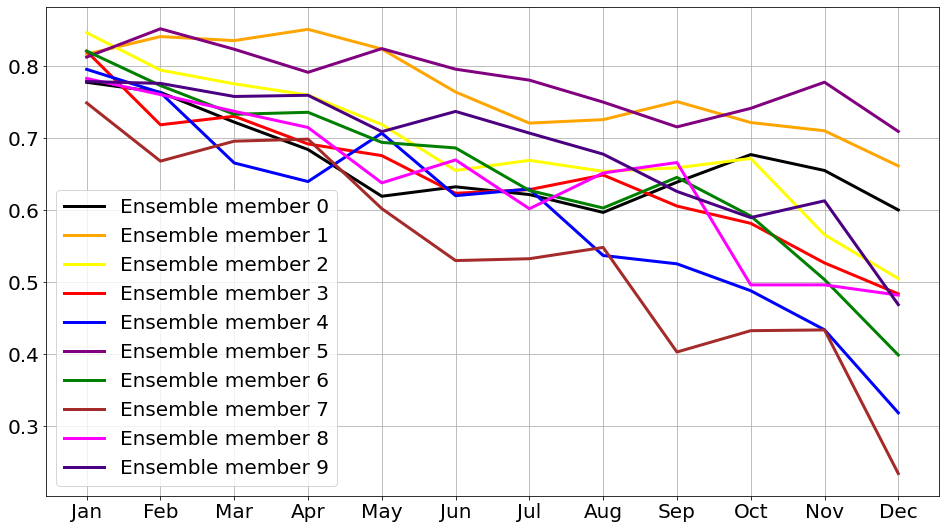

In [75]:
plt.figure(figsize=(16,9))
plt.rcParams.update({'font.size': 20})
xtics = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
colors = ['black', 'orange', 'yellow', 'red', 'blue', 'purple', 'green', 'brown', 'fuchsia', 'indigo']
#plt.plot(xtics, coeffs_mean, label=f'Average', c='black')
for model_num in range(10):
    plt.plot(xtics, coeffs[model_num], label=f'Ensemble member {model_num}', c=colors[model_num], linewidth=3)

#plt.title('Зависимость коэффициента корреляции от месяца')
#plt.xlabel('Месяц')
#plt.ylabel('Коэффициент корреляции')
plt.legend()
plt.grid()
plt.savefig('contents/models_info/months_correlation_models.eps', bbox_inches='tight')
plt.show()

In [76]:
coeffs_mean

array([0.79994293, 0.7709244 , 0.74754111, 0.73258839, 0.70109193,
       0.67129052, 0.65178313, 0.63918399, 0.6234702 , 0.59909615,
       0.57146595, 0.48608134])

# Соотношение сигнала величины индекса и шума

In [77]:
def get_variance(years, start_year):
    curr_years = np.array([years[j][start_year] for j in range(42)])
    years_pdo = [None for _ in range(42)]
    for j in range(42):
        years_pdo[j] = calculate_pdo(curr_years[j], eofs)
    years_pdo = np.array(years_pdo).flatten()
    curr_pdo = years_pdo[ : -(start_year + 1) * 12]

    # dates
    start_date = datetime(1980 + start_year + 1, 1, 16)
    end_date = datetime(2021, 12, 16)
    dates = []
    for dt in rrule.rrule(rrule.MONTHLY, dtstart=start_date, until=end_date):
        dates.append(dt)
    dates = np.array(dates)
    plt.figure(figsize=(16,9))
    plt.plot(dates, curr_pdo, label='PDO ансамбля', color='black')

    #calculate pdo over each ansamle member
    pdos = [[] for _ in range(10)]
    variances = [0.0 for _ in range(10)]
    for i in range(10):
        model = get_model_data(i)
        model = get_certain_years(model, start_year)
        ocean = prepare_data(model, 'ERA5')
        pdos[i] = calculate_pdo(ocean.reshape(504, 32, 65), eofs)
        pdos[i] = pdos[i][ : -(start_year + 1) * 12]
        curr_variance = curr_pdo - pdos[i]
        curr_variance = curr_variance**2
        curr_variance = curr_variance.mean()
        variances[i] = curr_variance
        print(variances[i])
        if i == 5 or i == 8:
            plt.plot(dates, pdos[i], label=f'PDO {i} члена ансамбля')
    pdos = np.array(pdos)
    
    plt.title(f'Индекс PDO ансамбля и отдельных его членов для {start_year + 1} года прогноза')
    plt.legend()
    #plt.xticks(dates[::12], rotation=45)
    plt.axhline(0, color='black', linestyle='--')
    plt.savefig(f'contents/variances/variance_{start_year}.eps')
    plt.show()

    return variances, years_pdo

In [78]:
years = []
for i in range(42):
    year = i + 1980
    curr_years = []
    curr_data = np.fromfile('data/HINDCASTS/TS' + str(year) + '.STD', dtype=np.float32).reshape(62, 10, 120, 180)
    curr_data = curr_data.mean(axis=1)
    for j in range(5):
        curr_year = curr_data[j * 12 + 2 : j * 12 + 2 + 12, :, :]
        curr_years.append(curr_year)
    years.append(curr_years)
years = np.array(years)
years = years.astype('float64')
years = prepare_data(years, mode='Models')

3.4309917442514393
3.617494539023369
3.6386175186416367
3.3500177074925794
3.3641788630642715
2.535808004807183
3.959870939975213
3.05451628416877
3.6684273570984285


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


2.5355797675562375


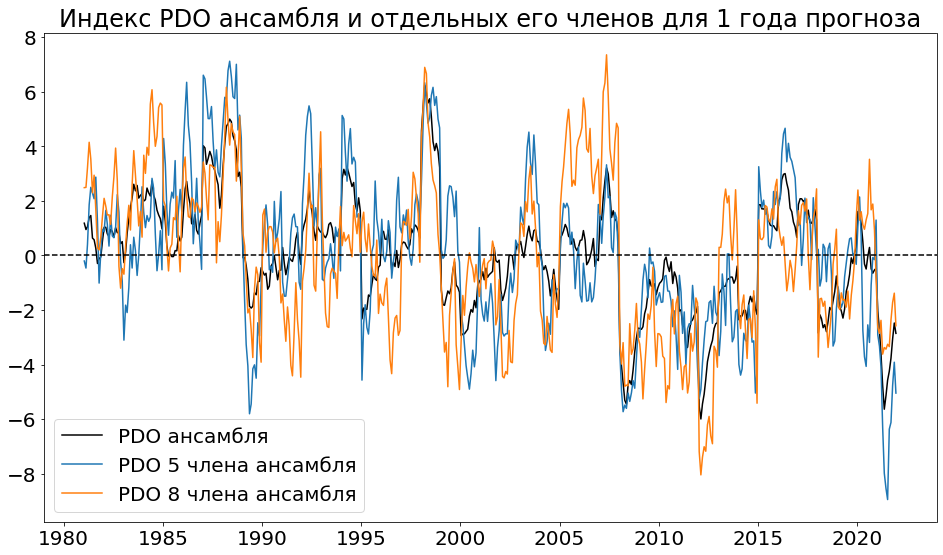

In [79]:
variances, years_pdo = get_variance(years, 0)

In [80]:
years_pdo.var()

4.278603161870844

In [81]:
for v in variances:
    print(f'{v:.3}')

3.43
3.62
3.64
3.35
3.36
2.54
3.96
3.05
3.67
2.54


3.954078974829967
5.41822835845636
4.815660178991646
3.459143293855071
4.528782409573044
3.591543102729534
4.764087028238519
4.122911196654842
5.276883371982245


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


4.1951613722001415


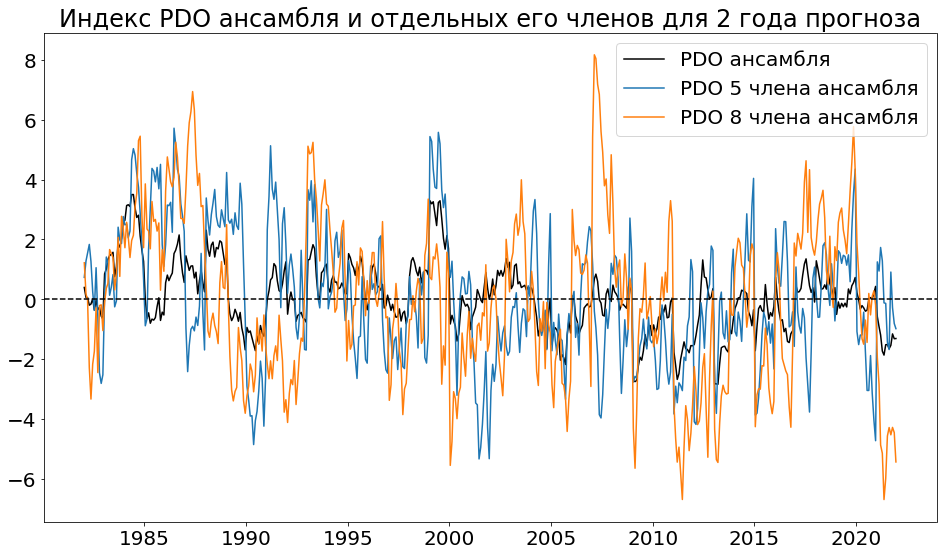

In [82]:
variances1, years_pdo1 = get_variance(years, 1)

In [83]:
for v in variances1:
    print(f'{v:.3}')

3.95
5.42
4.82
3.46
4.53
3.59
4.76
4.12
5.28
4.2


In [84]:
years_pdo1.var()

1.4567171190759975

3.8899665455237153
4.658107209644869
4.443473834519465
5.128108140829395
4.799120523501206
6.765407580402834
5.4328978265269585
4.763369512020887
4.046715625236078


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


4.663307826373943


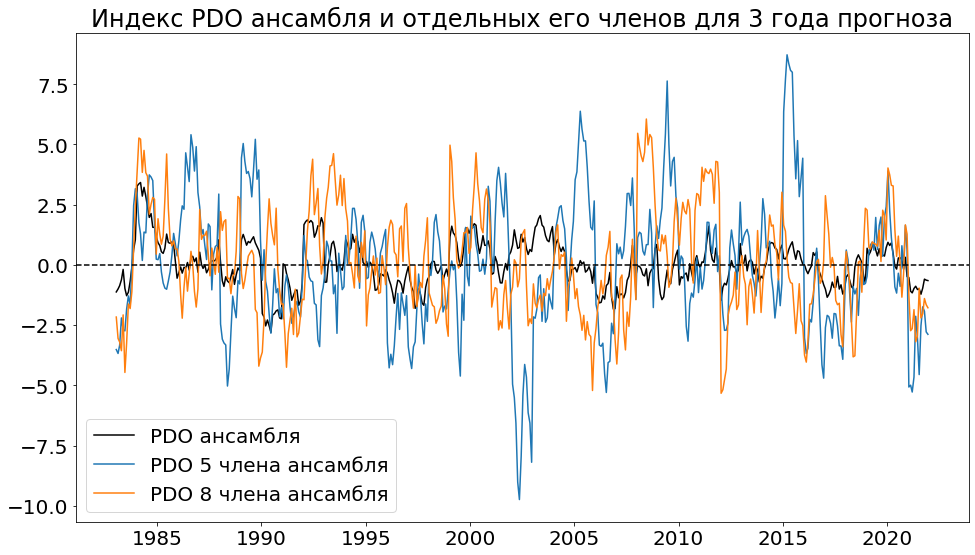

In [85]:
variances2, years_pdo2 = get_variance(years, 2)

In [86]:
for v in variances2:
    print(f'{v:.3}')

3.89
4.66
4.44
5.13
4.8
6.77
5.43
4.76
4.05
4.66


In [87]:
years_pdo2.var()

0.9131040922633531